# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [61]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [62]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

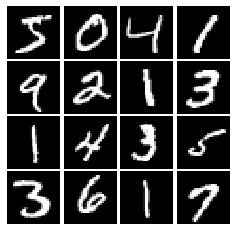

In [63]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [64]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(alpha*x, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [65]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [66]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform([batch_size, dim], minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [67]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [68]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(units=256, activation=leaky_relu, input_shape=(784,) ),
        tf.keras.layers.Dense(256, activation=leaky_relu),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [69]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [70]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(1024, input_shape=(noise_dim,), activation="relu"),
        tf.keras.layers.Dense(1024, activation="relu"),
        tf.keras.layers.Dense(784, activation="tanh"),
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [71]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [72]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    scores_real = tf.ones_like(logits_real)
    scores_fake = tf.zeros_like(logits_fake)
    
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    
    loss_real = cross_entropy(scores_real, logits_real)
    loss_fake = cross_entropy(scores_fake, logits_fake)
    
    loss = loss_real + loss_fake

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    scores_fake = tf.ones_like(logits_fake)
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    
    loss = cross_entropy(scores_fake, logits_fake)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [73]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [74]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [75]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [76]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.35, G:0.6811


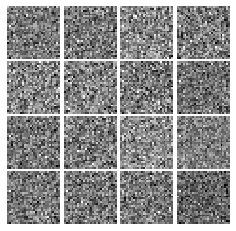

Epoch: 0, Iter: 20, D: 0.6194, G:0.9246


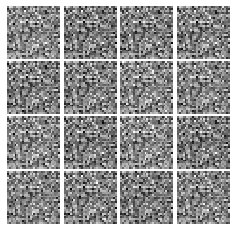

Epoch: 0, Iter: 40, D: 0.4781, G:1.017


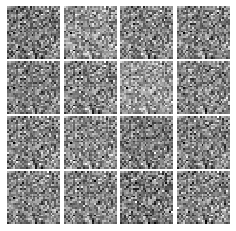

Epoch: 0, Iter: 60, D: 0.1553, G:2.287


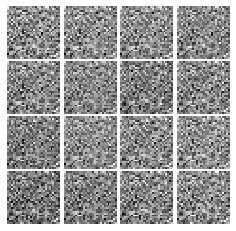

Epoch: 0, Iter: 80, D: 5.136, G:0.9097


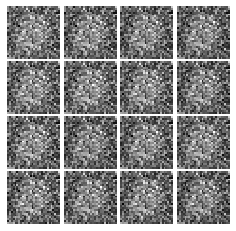

Epoch: 0, Iter: 100, D: 2.056, G:0.8767


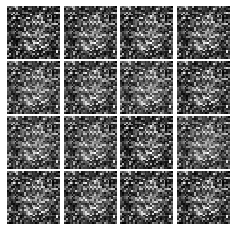

Epoch: 0, Iter: 120, D: 1.223, G:1.481


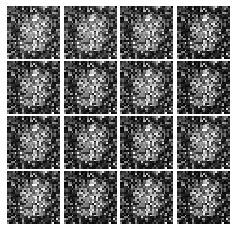

Epoch: 0, Iter: 140, D: 1.428, G:0.8373


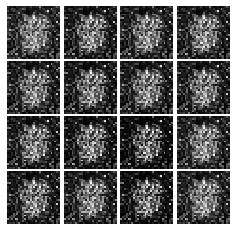

Epoch: 0, Iter: 160, D: 1.89, G:0.8697


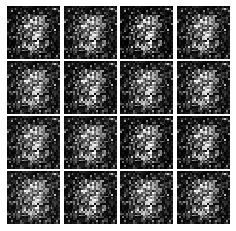

Epoch: 0, Iter: 180, D: 1.369, G:0.9398


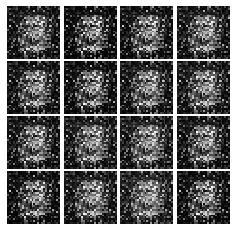

Epoch: 0, Iter: 200, D: 1.326, G:1.159


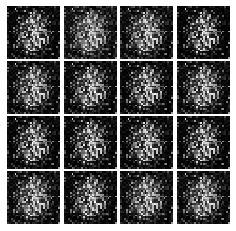

Epoch: 0, Iter: 220, D: 1.067, G:1.261


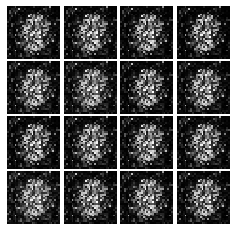

Epoch: 0, Iter: 240, D: 1.727, G:0.7223


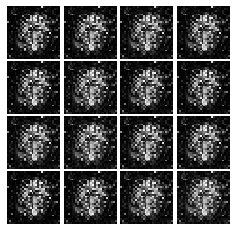

Epoch: 0, Iter: 260, D: 1.207, G:1.082


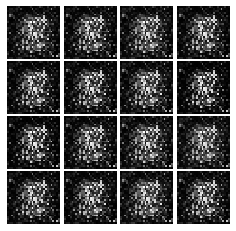

Epoch: 0, Iter: 280, D: 1.188, G:1.037


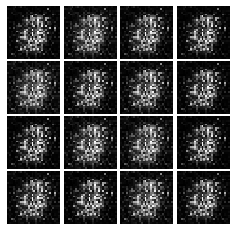

Epoch: 0, Iter: 300, D: 1.192, G:1.459


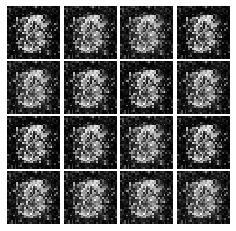

Epoch: 0, Iter: 320, D: 1.308, G:1.173


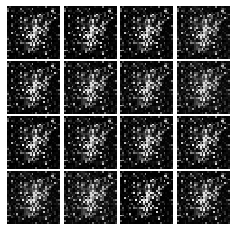

Epoch: 0, Iter: 340, D: 1.275, G:0.9698


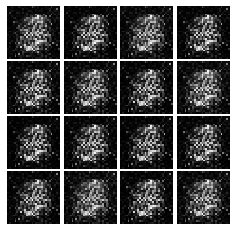

Epoch: 0, Iter: 360, D: 1.413, G:0.8158


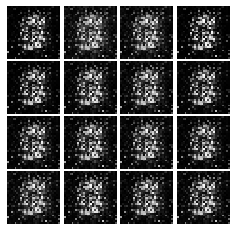

Epoch: 0, Iter: 380, D: 1.109, G:1.174


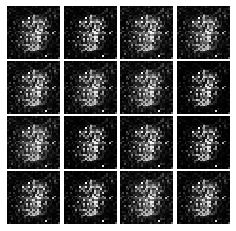

Epoch: 0, Iter: 400, D: 1.079, G:1.391


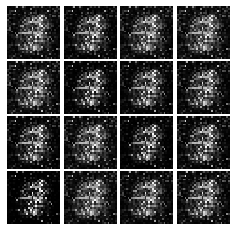

Epoch: 0, Iter: 420, D: 1.238, G:0.9033


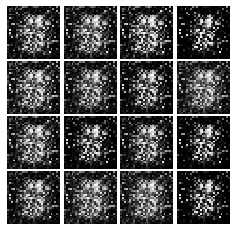

Epoch: 0, Iter: 440, D: 1.432, G:0.8087


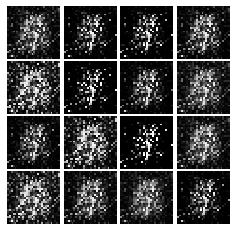

Epoch: 0, Iter: 460, D: 1.364, G:0.9912


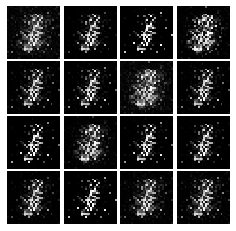

Epoch: 1, Iter: 480, D: 1.264, G:1.259


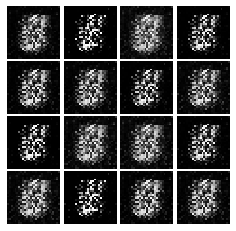

Epoch: 1, Iter: 500, D: 1.022, G:1.384


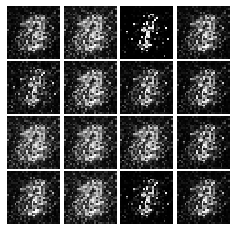

Epoch: 1, Iter: 520, D: 1.262, G:3.297


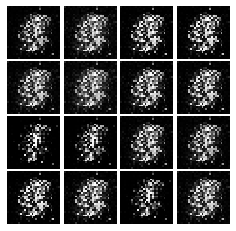

Epoch: 1, Iter: 540, D: 1.433, G:0.8168


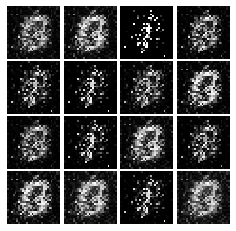

Epoch: 1, Iter: 560, D: 1.114, G:1.127


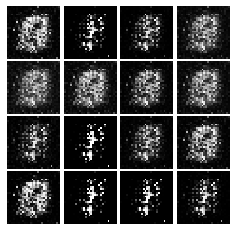

Epoch: 1, Iter: 580, D: 1.338, G:1.108


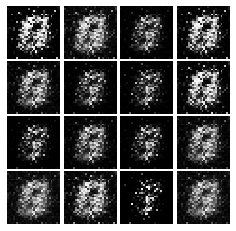

Epoch: 1, Iter: 600, D: 2.222, G:0.3531


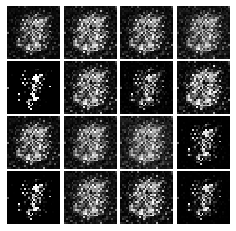

Epoch: 1, Iter: 620, D: 1.277, G:1.147


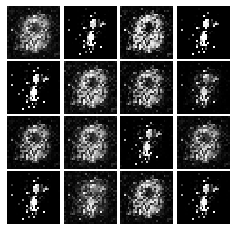

Epoch: 1, Iter: 640, D: 1.2, G:1.709


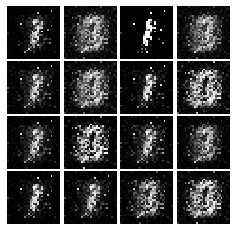

Epoch: 1, Iter: 660, D: 1.146, G:1.039


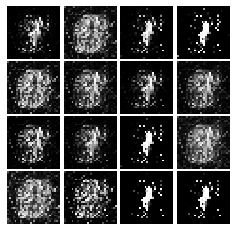

Epoch: 1, Iter: 680, D: 1.725, G:1.251


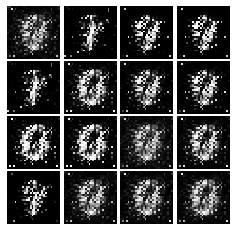

Epoch: 1, Iter: 700, D: 1.823, G:1.099


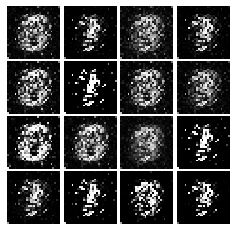

Epoch: 1, Iter: 720, D: 1.082, G:0.9525


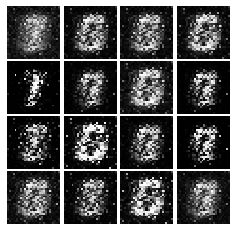

Epoch: 1, Iter: 740, D: 1.448, G:0.8754


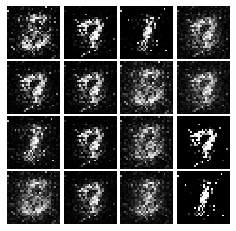

Epoch: 1, Iter: 760, D: 1.281, G:1.062


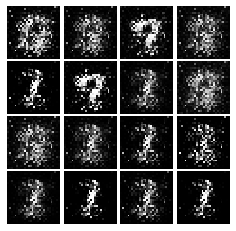

Epoch: 1, Iter: 780, D: 1.429, G:0.9595


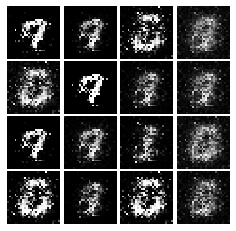

Epoch: 1, Iter: 800, D: 1.234, G:1.116


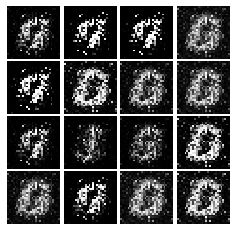

Epoch: 1, Iter: 820, D: 1.711, G:1.096


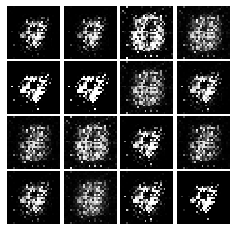

Epoch: 1, Iter: 840, D: 1.523, G:1.323


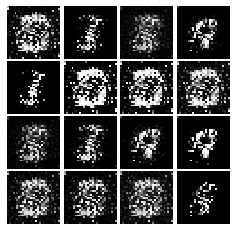

Epoch: 1, Iter: 860, D: 1.092, G:1.025


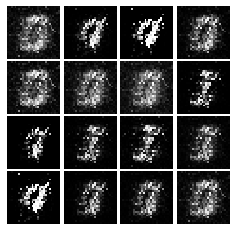

Epoch: 1, Iter: 880, D: 1.216, G:1.283


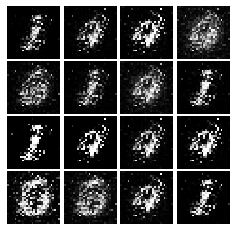

Epoch: 1, Iter: 900, D: 1.465, G:0.7515


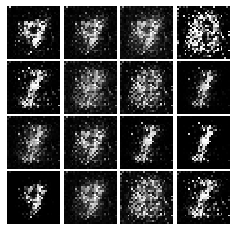

Epoch: 1, Iter: 920, D: 1.362, G:0.9582


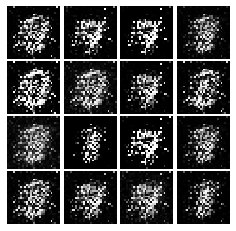

Epoch: 2, Iter: 940, D: 1.448, G:1.314


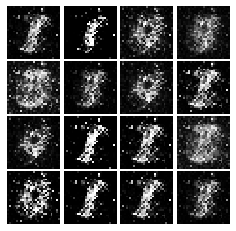

Epoch: 2, Iter: 960, D: 1.099, G:1.098


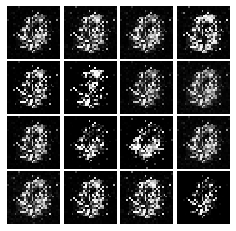

Epoch: 2, Iter: 980, D: 1.237, G:1.052


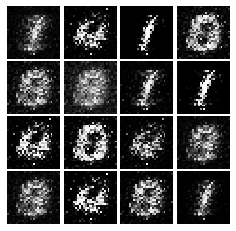

Epoch: 2, Iter: 1000, D: 1.212, G:1.122


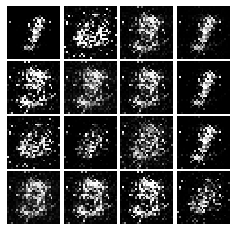

Epoch: 2, Iter: 1020, D: 1.576, G:1.262


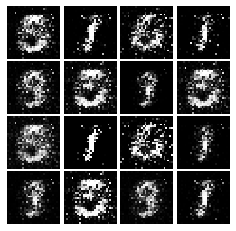

Epoch: 2, Iter: 1040, D: 1.007, G:0.5729


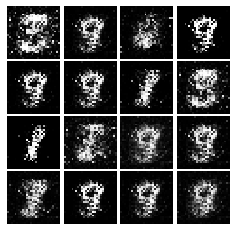

Epoch: 2, Iter: 1060, D: 1.168, G:1.157


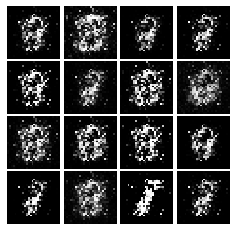

Epoch: 2, Iter: 1080, D: 0.8041, G:0.6702


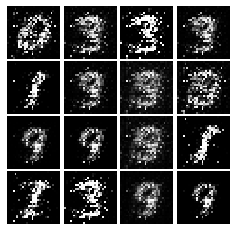

Epoch: 2, Iter: 1100, D: 2.124, G:2.438


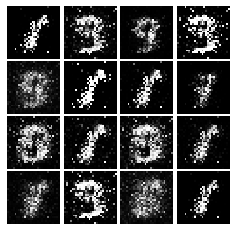

Epoch: 2, Iter: 1120, D: 1.027, G:1.061


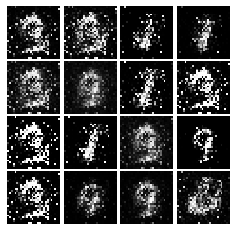

Epoch: 2, Iter: 1140, D: 1.172, G:1.423


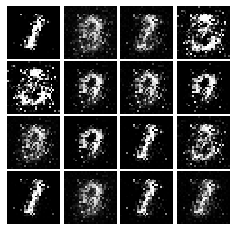

Epoch: 2, Iter: 1160, D: 1.426, G:0.8684


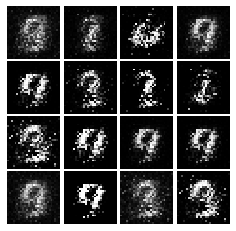

Epoch: 2, Iter: 1180, D: 1.209, G:1.058


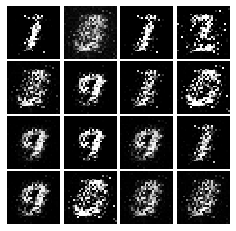

Epoch: 2, Iter: 1200, D: 1.381, G:1.063


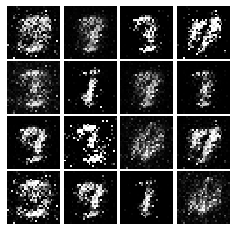

Epoch: 2, Iter: 1220, D: 1.66, G:1.331


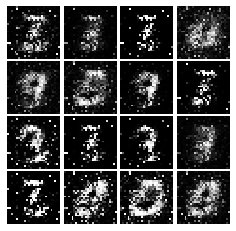

Epoch: 2, Iter: 1240, D: 1.253, G:1.061


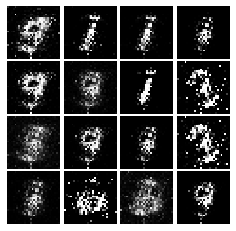

Epoch: 2, Iter: 1260, D: 1.62, G:0.8083


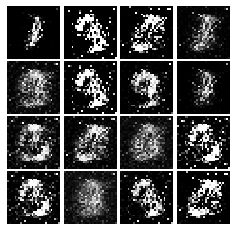

Epoch: 2, Iter: 1280, D: 1.249, G:0.9895


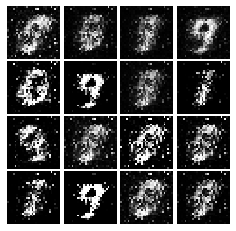

Epoch: 2, Iter: 1300, D: 1.166, G:1.105


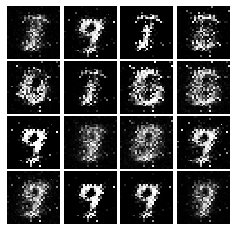

Epoch: 2, Iter: 1320, D: 1.315, G:1.027


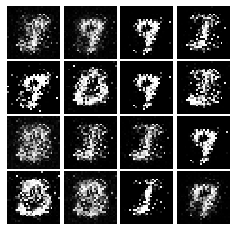

Epoch: 2, Iter: 1340, D: 1.309, G:1.08


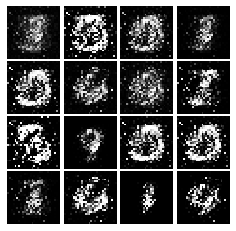

Epoch: 2, Iter: 1360, D: 1.333, G:0.8714


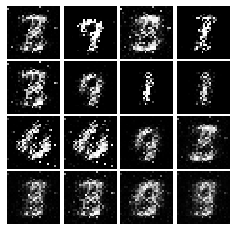

Epoch: 2, Iter: 1380, D: 1.235, G:0.791


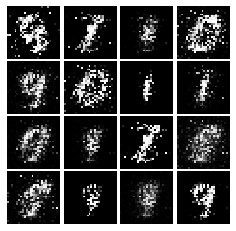

Epoch: 2, Iter: 1400, D: 1.423, G:0.3842


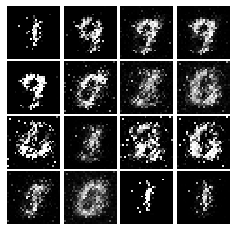

Epoch: 3, Iter: 1420, D: 0.9241, G:0.7496


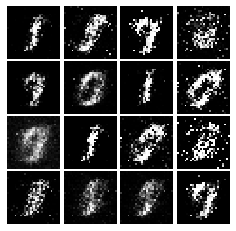

Epoch: 3, Iter: 1440, D: 1.596, G:1.613


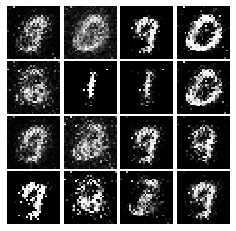

Epoch: 3, Iter: 1460, D: 1.21, G:1.152


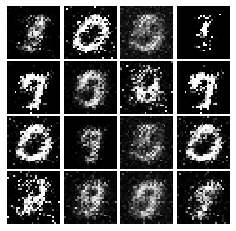

Epoch: 3, Iter: 1480, D: 1.27, G:0.7522


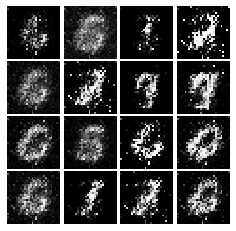

Epoch: 3, Iter: 1500, D: 1.282, G:1.027


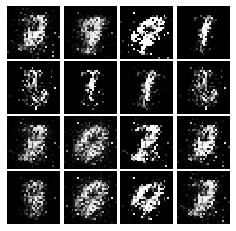

Epoch: 3, Iter: 1520, D: 1.227, G:1.027


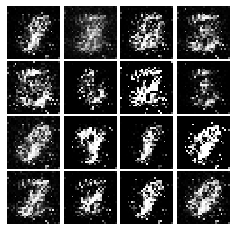

Epoch: 3, Iter: 1540, D: 1.253, G:0.9309


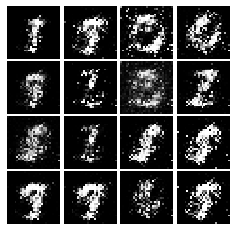

Epoch: 3, Iter: 1560, D: 1.209, G:0.9502


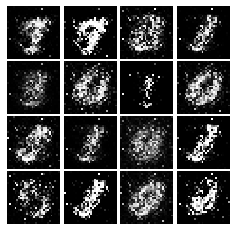

Epoch: 3, Iter: 1580, D: 1.24, G:1.911


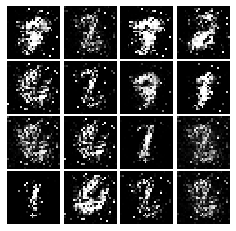

Epoch: 3, Iter: 1600, D: 1.279, G:2.355


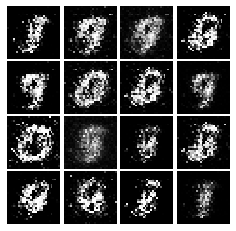

Epoch: 3, Iter: 1620, D: 1.117, G:1.011


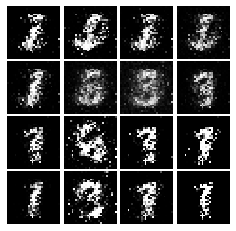

Epoch: 3, Iter: 1640, D: 1.303, G:1.085


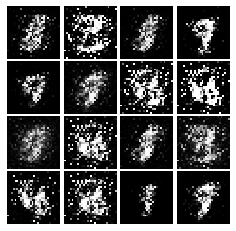

Epoch: 3, Iter: 1660, D: 1.348, G:1.993


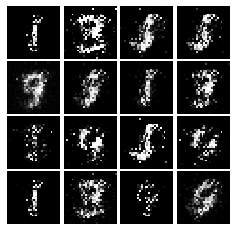

Epoch: 3, Iter: 1680, D: 1.079, G:1.09


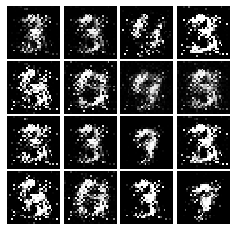

Epoch: 3, Iter: 1700, D: 1.086, G:1.001


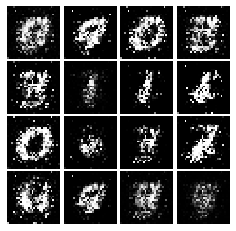

Epoch: 3, Iter: 1720, D: 1.35, G:0.8374


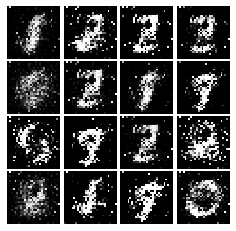

Epoch: 3, Iter: 1740, D: 1.482, G:0.9753


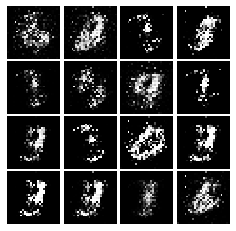

Epoch: 3, Iter: 1760, D: 1.193, G:0.9797


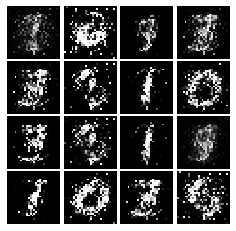

Epoch: 3, Iter: 1780, D: 1.243, G:0.8467


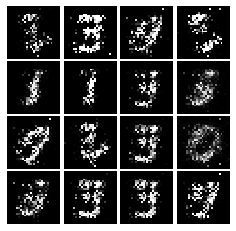

Epoch: 3, Iter: 1800, D: 1.095, G:1.375


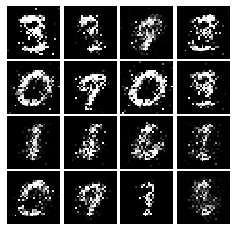

Epoch: 3, Iter: 1820, D: 1.212, G:1.303


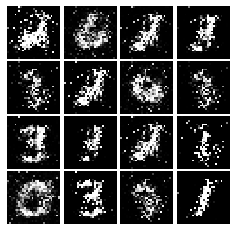

Epoch: 3, Iter: 1840, D: 1.643, G:0.9119


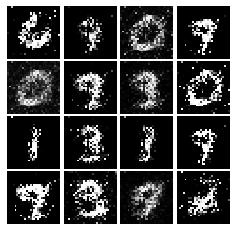

Epoch: 3, Iter: 1860, D: 0.8794, G:0.9798


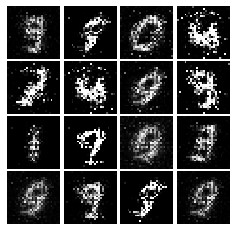

Epoch: 4, Iter: 1880, D: 1.287, G:1.143


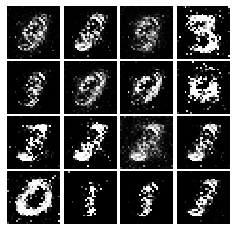

Epoch: 4, Iter: 1900, D: 1.241, G:0.9112


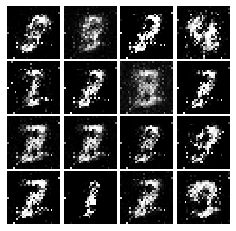

Epoch: 4, Iter: 1920, D: 1.182, G:0.9286


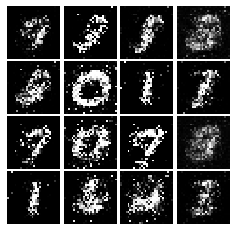

Epoch: 4, Iter: 1940, D: 1.238, G:1.02


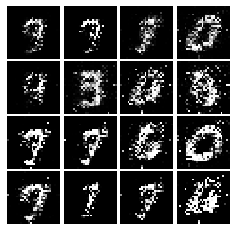

Epoch: 4, Iter: 1960, D: 1.388, G:1.182


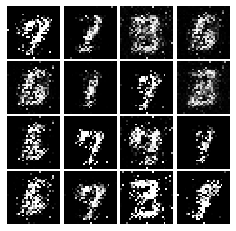

Epoch: 4, Iter: 1980, D: 2.597, G:1.219


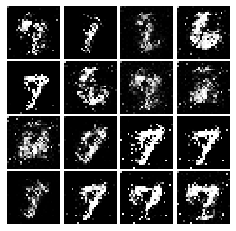

Epoch: 4, Iter: 2000, D: 1.274, G:1.042


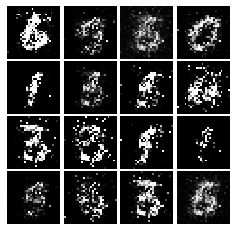

Epoch: 4, Iter: 2020, D: 1.327, G:1.198


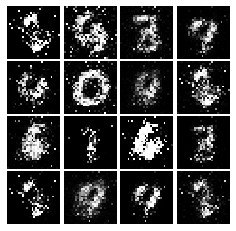

Epoch: 4, Iter: 2040, D: 1.186, G:0.9557


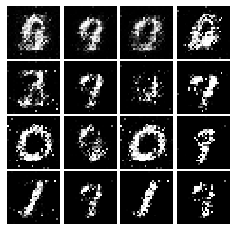

Epoch: 4, Iter: 2060, D: 1.109, G:1.202


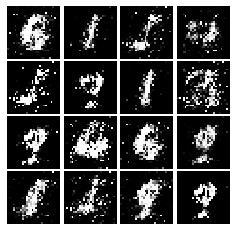

Epoch: 4, Iter: 2080, D: 1.28, G:1.234


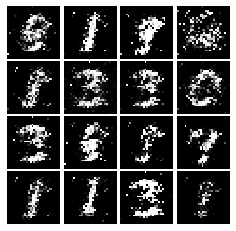

Epoch: 4, Iter: 2100, D: 1.101, G:1.408


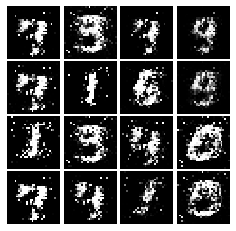

Epoch: 4, Iter: 2120, D: 1.14, G:0.9486


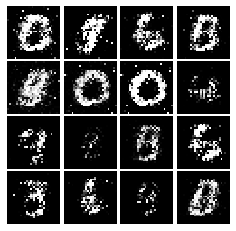

Epoch: 4, Iter: 2140, D: 1.166, G:1.622


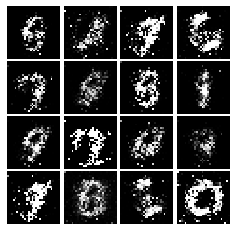

Epoch: 4, Iter: 2160, D: 1.302, G:0.8671


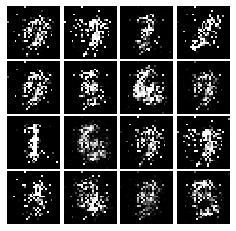

Epoch: 4, Iter: 2180, D: 1.287, G:0.9488


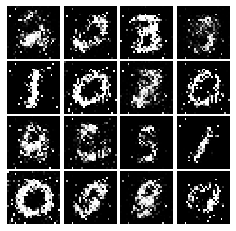

Epoch: 4, Iter: 2200, D: 1.272, G:0.9065


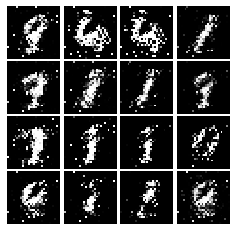

Epoch: 4, Iter: 2220, D: 1.297, G:0.9694


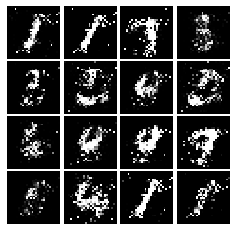

Epoch: 4, Iter: 2240, D: 1.157, G:0.9713


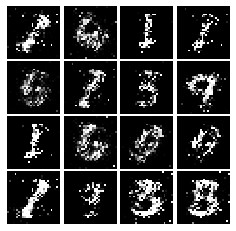

Epoch: 4, Iter: 2260, D: 1.345, G:0.974


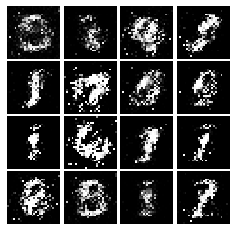

Epoch: 4, Iter: 2280, D: 1.157, G:0.9998


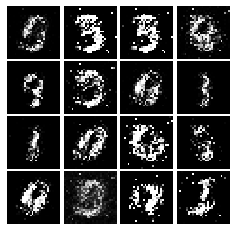

Epoch: 4, Iter: 2300, D: 1.207, G:1.067


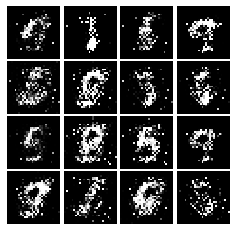

Epoch: 4, Iter: 2320, D: 1.118, G:1.076


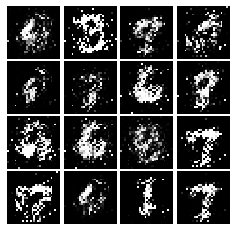

Epoch: 4, Iter: 2340, D: 1.026, G:1.239


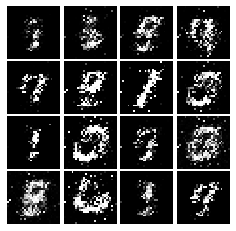

Epoch: 5, Iter: 2360, D: 1.203, G:1.246


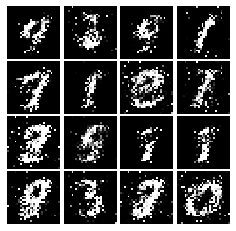

Epoch: 5, Iter: 2380, D: 1.055, G:1.092


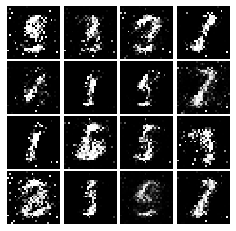

Epoch: 5, Iter: 2400, D: 1.176, G:1.204


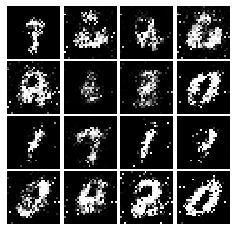

Epoch: 5, Iter: 2420, D: 1.241, G:1.074


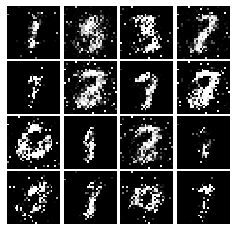

Epoch: 5, Iter: 2440, D: 1.097, G:1.211


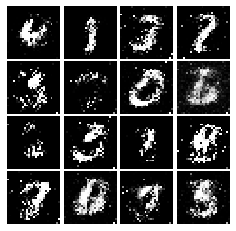

Epoch: 5, Iter: 2460, D: 1.946, G:1.279


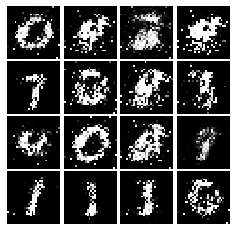

Epoch: 5, Iter: 2480, D: 1.172, G:1.029


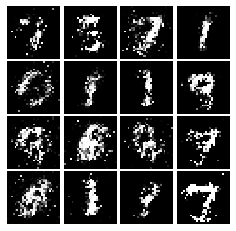

Epoch: 5, Iter: 2500, D: 1.216, G:0.9075


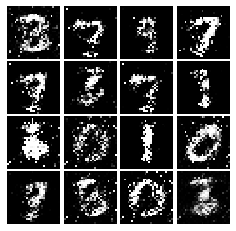

Epoch: 5, Iter: 2520, D: 1.376, G:0.907


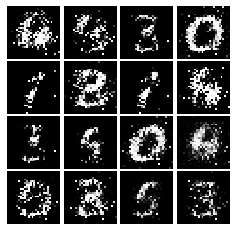

Epoch: 5, Iter: 2540, D: 1.2, G:1.072


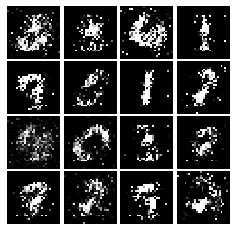

Epoch: 5, Iter: 2560, D: 1.361, G:0.9976


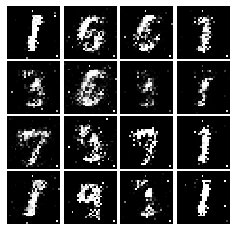

Epoch: 5, Iter: 2580, D: 1.182, G:1.135


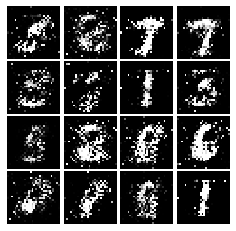

Epoch: 5, Iter: 2600, D: 1.353, G:0.8631


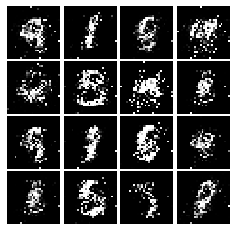

Epoch: 5, Iter: 2620, D: 1.362, G:1.039


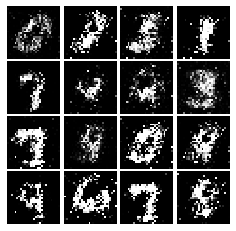

Epoch: 5, Iter: 2640, D: 1.281, G:1.144


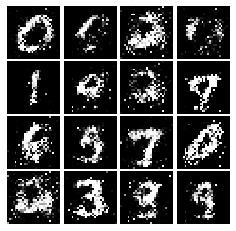

Epoch: 5, Iter: 2660, D: 1.302, G:1.054


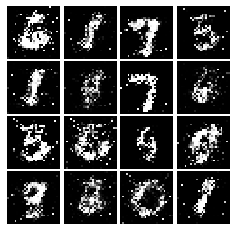

Epoch: 5, Iter: 2680, D: 1.285, G:0.848


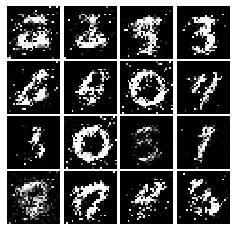

Epoch: 5, Iter: 2700, D: 1.379, G:1.049


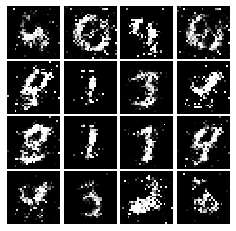

Epoch: 5, Iter: 2720, D: 1.298, G:0.8931


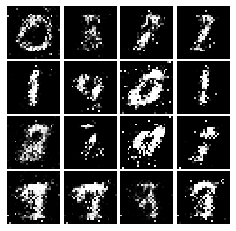

Epoch: 5, Iter: 2740, D: 1.291, G:0.8256


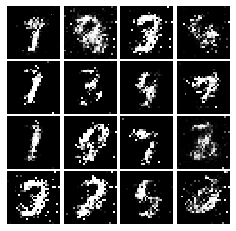

Epoch: 5, Iter: 2760, D: 1.236, G:0.7987


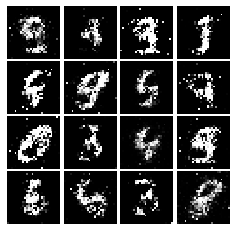

Epoch: 5, Iter: 2780, D: 1.239, G:0.8302


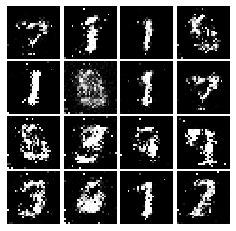

Epoch: 5, Iter: 2800, D: 1.369, G:0.9326


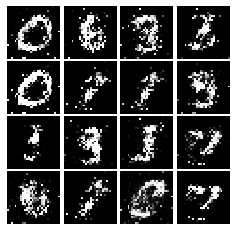

Epoch: 6, Iter: 2820, D: 1.31, G:0.9239


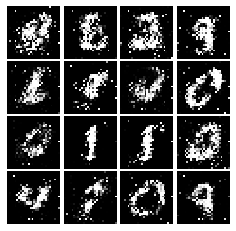

Epoch: 6, Iter: 2840, D: 1.46, G:0.8798


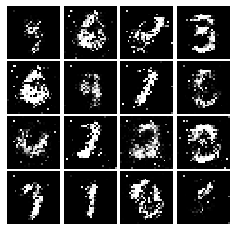

Epoch: 6, Iter: 2860, D: 1.375, G:0.7142


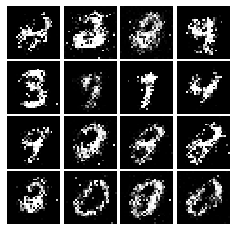

Epoch: 6, Iter: 2880, D: 1.11, G:1.093


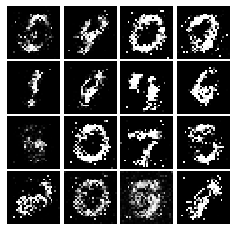

Epoch: 6, Iter: 2900, D: 1.153, G:0.8169


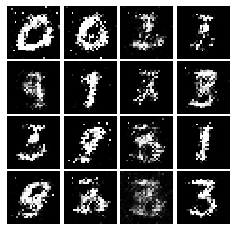

Epoch: 6, Iter: 2920, D: 1.366, G:0.9395


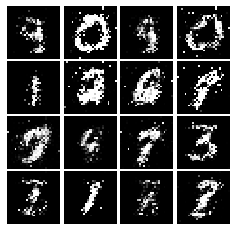

Epoch: 6, Iter: 2940, D: 1.252, G:0.9446


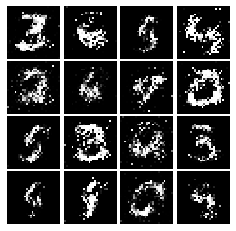

Epoch: 6, Iter: 2960, D: 1.23, G:0.8692


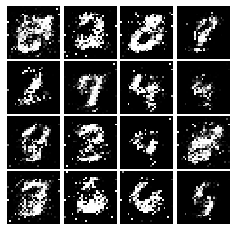

Epoch: 6, Iter: 2980, D: 1.352, G:0.8796


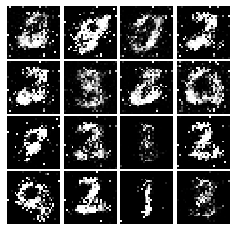

Epoch: 6, Iter: 3000, D: 1.271, G:0.8297


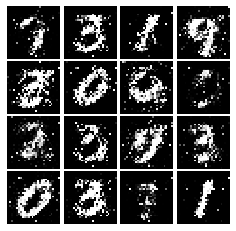

Epoch: 6, Iter: 3020, D: 1.263, G:0.8782


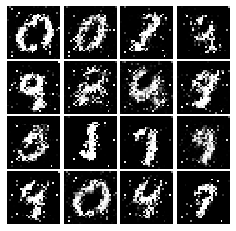

Epoch: 6, Iter: 3040, D: 1.399, G:0.8682


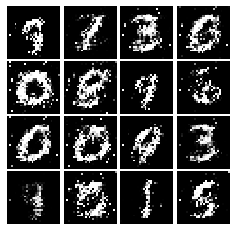

Epoch: 6, Iter: 3060, D: 1.288, G:0.9527


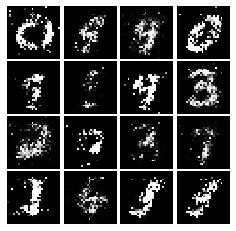

Epoch: 6, Iter: 3080, D: 1.272, G:0.8867


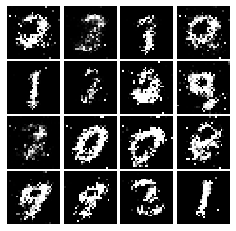

Epoch: 6, Iter: 3100, D: 1.369, G:0.886


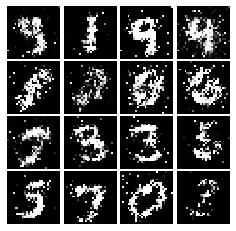

Epoch: 6, Iter: 3120, D: 1.288, G:0.8211


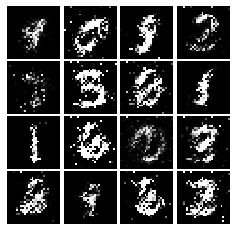

Epoch: 6, Iter: 3140, D: 1.4, G:0.7975


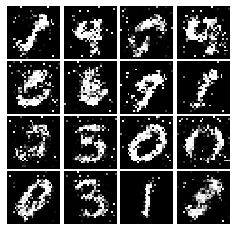

Epoch: 6, Iter: 3160, D: 1.268, G:0.8859


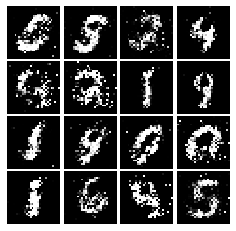

Epoch: 6, Iter: 3180, D: 1.263, G:0.8008


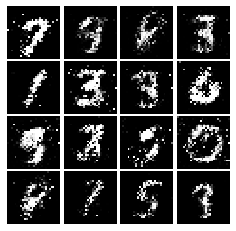

Epoch: 6, Iter: 3200, D: 1.327, G:0.8951


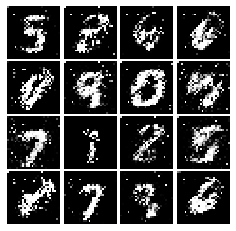

Epoch: 6, Iter: 3220, D: 1.241, G:0.8778


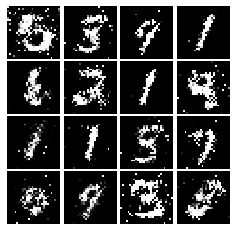

Epoch: 6, Iter: 3240, D: 1.329, G:0.8838


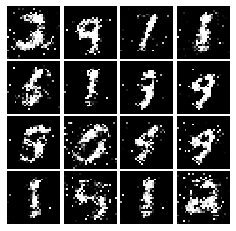

Epoch: 6, Iter: 3260, D: 1.381, G:0.8869


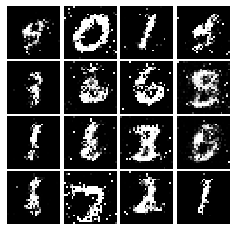

Epoch: 6, Iter: 3280, D: 1.385, G:0.9137


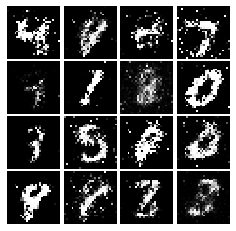

Epoch: 7, Iter: 3300, D: 1.297, G:0.7743


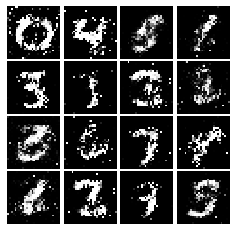

Epoch: 7, Iter: 3320, D: 1.16, G:0.8945


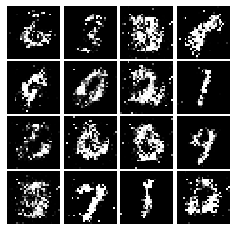

Epoch: 7, Iter: 3340, D: 1.28, G:0.9501


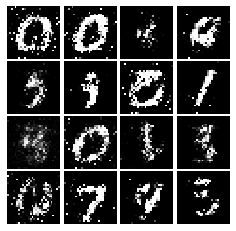

Epoch: 7, Iter: 3360, D: 1.406, G:0.8003


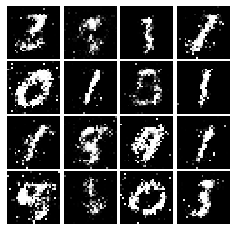

Epoch: 7, Iter: 3380, D: 1.349, G:0.768


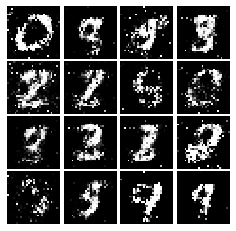

Epoch: 7, Iter: 3400, D: 1.358, G:0.8558


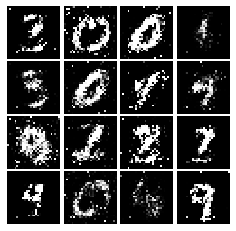

Epoch: 7, Iter: 3420, D: 1.327, G:0.8533


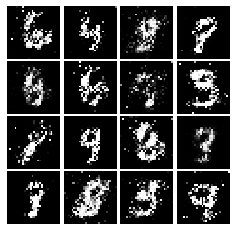

Epoch: 7, Iter: 3440, D: 1.321, G:0.9966


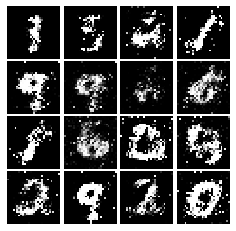

Epoch: 7, Iter: 3460, D: 1.285, G:0.8658


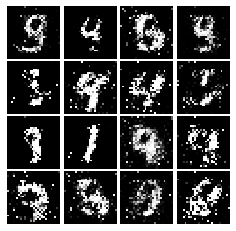

Epoch: 7, Iter: 3480, D: 1.353, G:0.7341


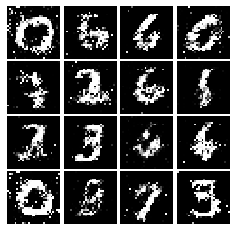

Epoch: 7, Iter: 3500, D: 1.26, G:0.9743


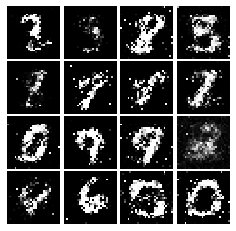

Epoch: 7, Iter: 3520, D: 1.298, G:0.7099


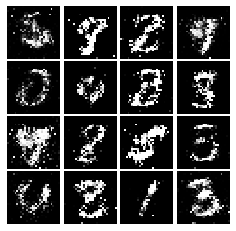

Epoch: 7, Iter: 3540, D: 1.346, G:0.7964


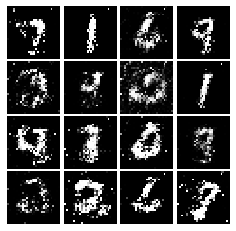

Epoch: 7, Iter: 3560, D: 1.288, G:0.8545


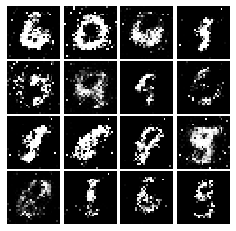

Epoch: 7, Iter: 3580, D: 1.321, G:0.8127


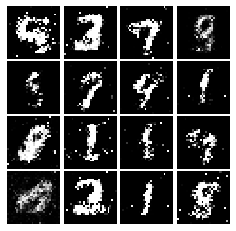

Epoch: 7, Iter: 3600, D: 1.364, G:0.7011


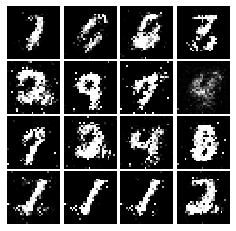

Epoch: 7, Iter: 3620, D: 1.335, G:0.8088


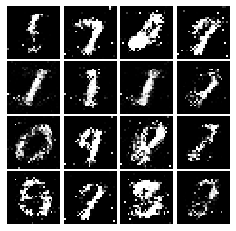

Epoch: 7, Iter: 3640, D: 1.365, G:0.8829


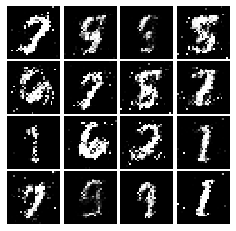

Epoch: 7, Iter: 3660, D: 1.302, G:0.8187


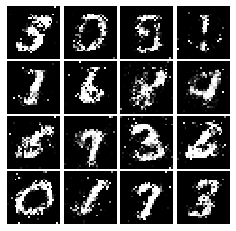

Epoch: 7, Iter: 3680, D: 1.304, G:0.7691


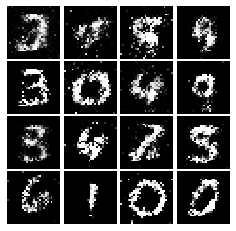

Epoch: 7, Iter: 3700, D: 1.325, G:0.7808


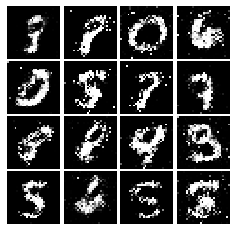

Epoch: 7, Iter: 3720, D: 1.317, G:0.8447


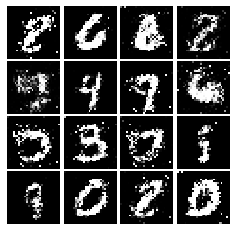

Epoch: 7, Iter: 3740, D: 1.395, G:0.7411


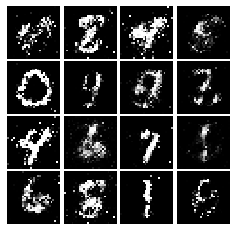

Epoch: 8, Iter: 3760, D: 1.366, G:0.6998


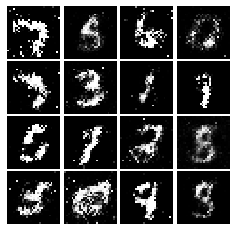

Epoch: 8, Iter: 3780, D: 1.387, G:0.7344


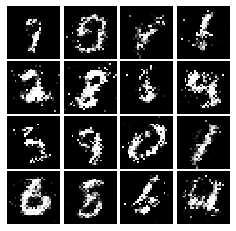

Epoch: 8, Iter: 3800, D: 1.31, G:0.8182


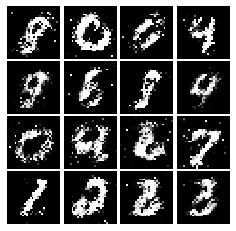

Epoch: 8, Iter: 3820, D: 1.415, G:0.7353


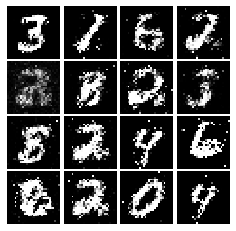

Epoch: 8, Iter: 3840, D: 1.326, G:0.7531


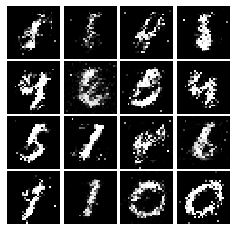

Epoch: 8, Iter: 3860, D: 1.339, G:0.7811


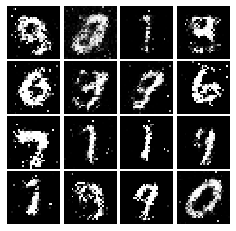

Epoch: 8, Iter: 3880, D: 1.308, G:0.7306


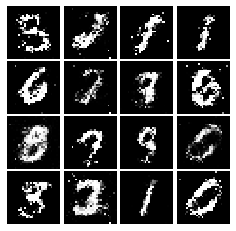

Epoch: 8, Iter: 3900, D: 1.377, G:0.7922


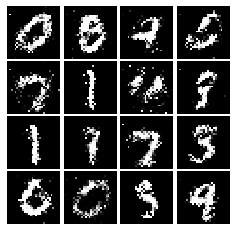

Epoch: 8, Iter: 3920, D: 1.309, G:0.7786


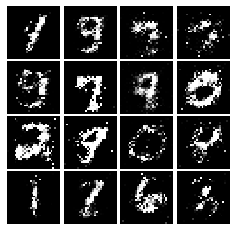

Epoch: 8, Iter: 3940, D: 1.341, G:0.7764


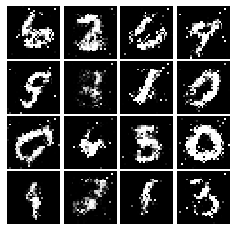

Epoch: 8, Iter: 3960, D: 1.353, G:0.8132


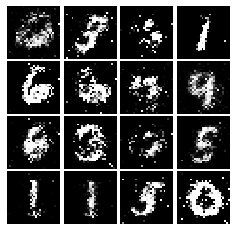

Epoch: 8, Iter: 3980, D: 1.364, G:0.8137


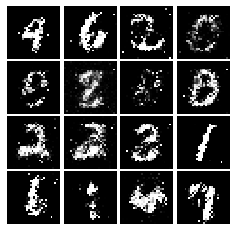

Epoch: 8, Iter: 4000, D: 1.248, G:0.8507


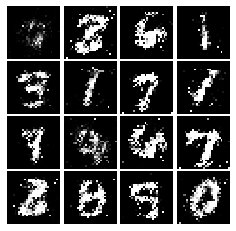

Epoch: 8, Iter: 4020, D: 1.287, G:0.7267


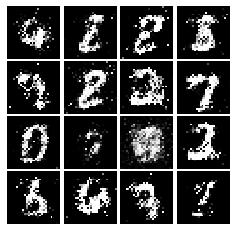

Epoch: 8, Iter: 4040, D: 1.332, G:0.7824


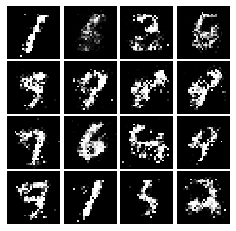

Epoch: 8, Iter: 4060, D: 1.304, G:0.7443


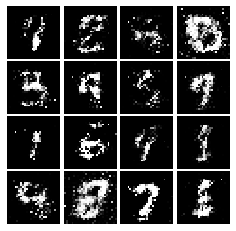

Epoch: 8, Iter: 4080, D: 1.28, G:0.8622


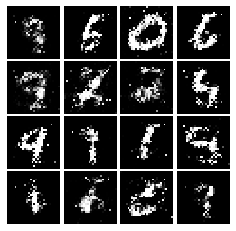

Epoch: 8, Iter: 4100, D: 1.364, G:0.764


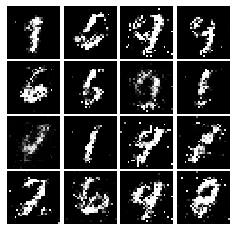

Epoch: 8, Iter: 4120, D: 1.373, G:0.7488


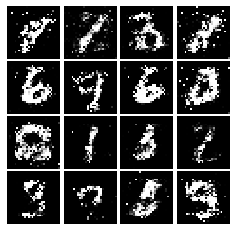

Epoch: 8, Iter: 4140, D: 1.334, G:0.9213


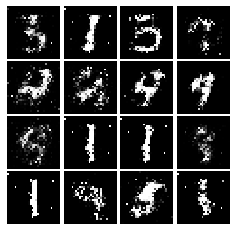

Epoch: 8, Iter: 4160, D: 1.343, G:0.7999


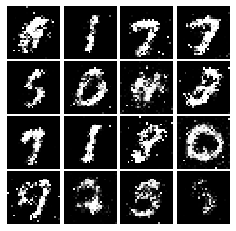

Epoch: 8, Iter: 4180, D: 1.294, G:0.8049


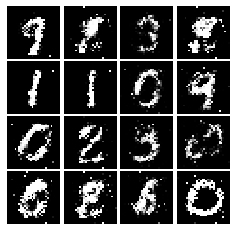

Epoch: 8, Iter: 4200, D: 1.346, G:0.862


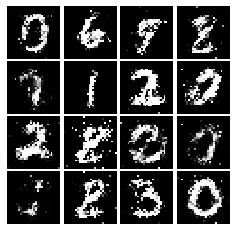

Epoch: 8, Iter: 4220, D: 1.321, G:0.7928


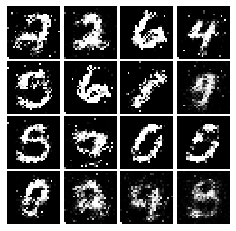

Epoch: 9, Iter: 4240, D: 1.421, G:0.7821


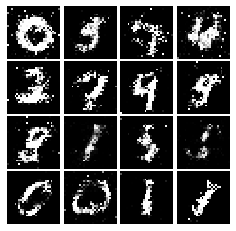

Epoch: 9, Iter: 4260, D: 1.309, G:0.7959


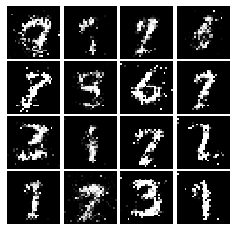

Epoch: 9, Iter: 4280, D: 1.428, G:0.8041


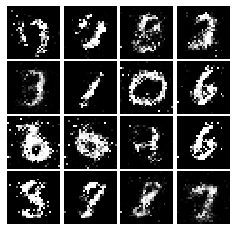

Epoch: 9, Iter: 4300, D: 1.389, G:0.8655


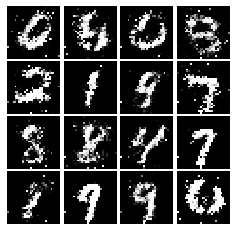

Epoch: 9, Iter: 4320, D: 1.376, G:0.7782


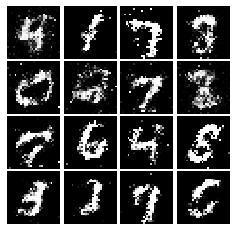

Epoch: 9, Iter: 4340, D: 1.437, G:0.8581


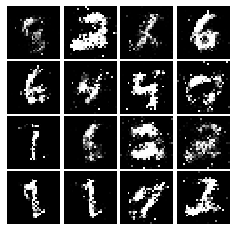

Epoch: 9, Iter: 4360, D: 1.457, G:1.081


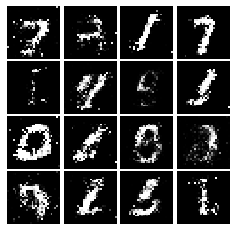

Epoch: 9, Iter: 4380, D: 1.436, G:0.8436


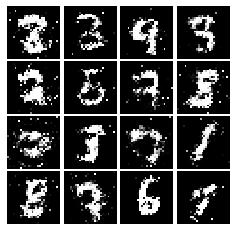

Epoch: 9, Iter: 4400, D: 1.271, G:0.8244


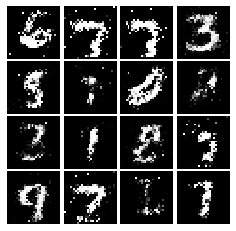

Epoch: 9, Iter: 4420, D: 1.282, G:0.7885


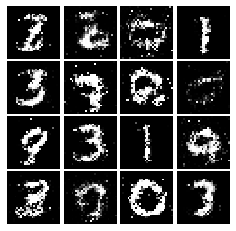

Epoch: 9, Iter: 4440, D: 1.372, G:0.9116


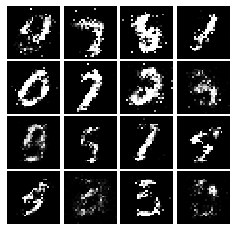

Epoch: 9, Iter: 4460, D: 1.333, G:0.7232


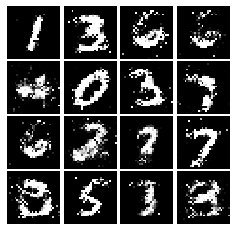

Epoch: 9, Iter: 4480, D: 1.329, G:0.7095


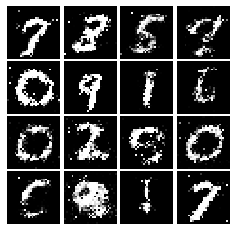

Epoch: 9, Iter: 4500, D: 1.425, G:0.7452


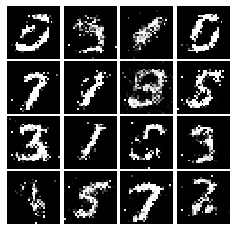

Epoch: 9, Iter: 4520, D: 1.378, G:0.8111


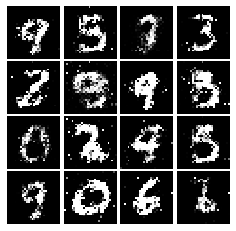

Epoch: 9, Iter: 4540, D: 1.4, G:0.6806


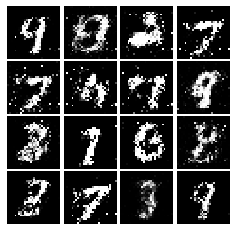

Epoch: 9, Iter: 4560, D: 1.373, G:0.7573


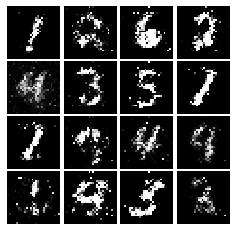

Epoch: 9, Iter: 4580, D: 1.28, G:0.8709


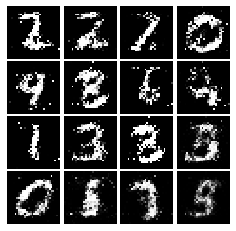

Epoch: 9, Iter: 4600, D: 1.351, G:0.7711


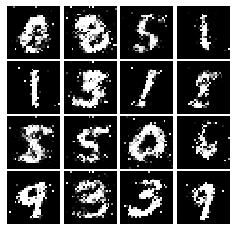

Epoch: 9, Iter: 4620, D: 1.311, G:0.8289


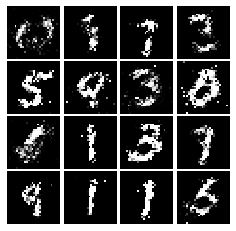

Epoch: 9, Iter: 4640, D: 1.363, G:0.8188


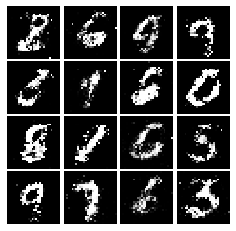

Epoch: 9, Iter: 4660, D: 1.334, G:0.7594


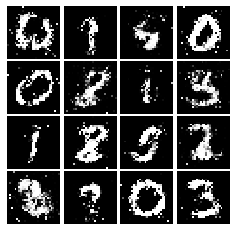

Epoch: 9, Iter: 4680, D: 1.324, G:0.7916


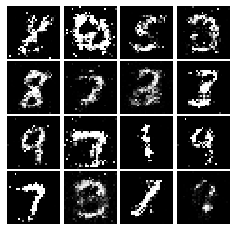

Final images


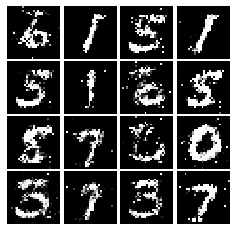

In [77]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [93]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss_real = 0.5*tf.reduce_mean(tf.square(scores_real-1))
    loss_fake = 0.5*tf.reduce_mean(tf.square(scores_fake))
    loss = loss_real + loss_fake
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5*tf.reduce_mean(tf.square(scores_fake -1))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [94]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.2447, G:0.3943


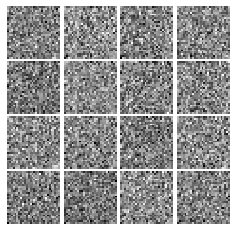

Epoch: 0, Iter: 20, D: 0.043, G:1.254


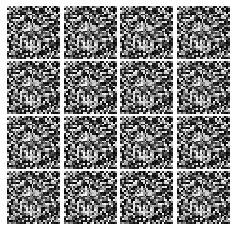

Epoch: 0, Iter: 40, D: 0.03816, G:0.7263


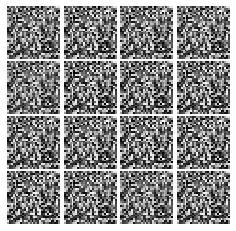

Epoch: 0, Iter: 60, D: 0.02024, G:0.8758


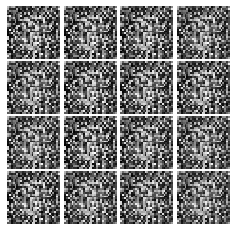

Epoch: 0, Iter: 80, D: 0.1721, G:0.2738


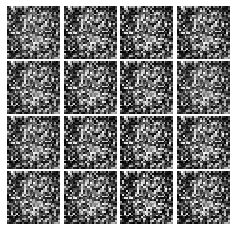

Epoch: 0, Iter: 100, D: 0.02144, G:0.6224


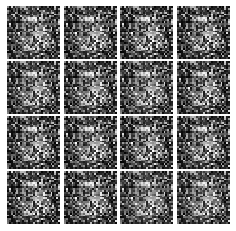

Epoch: 0, Iter: 120, D: 0.1346, G:1.088


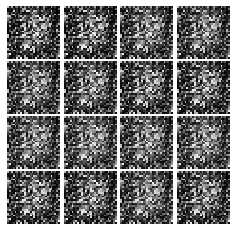

Epoch: 0, Iter: 140, D: 0.5994, G:0.2637


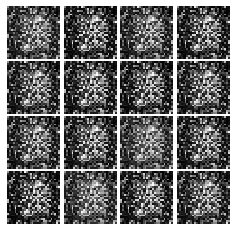

Epoch: 0, Iter: 160, D: 0.7457, G:0.2584


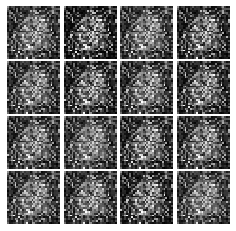

Epoch: 0, Iter: 180, D: 1.161, G:0.1474


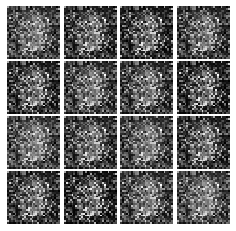

Epoch: 0, Iter: 200, D: 0.08339, G:0.4718


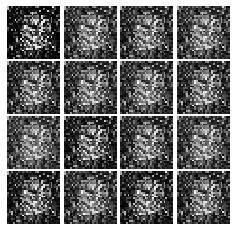

Epoch: 0, Iter: 220, D: 0.1453, G:0.5186


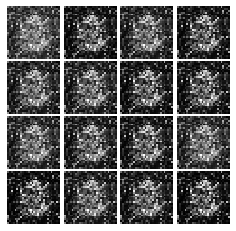

Epoch: 0, Iter: 240, D: 0.1406, G:0.2288


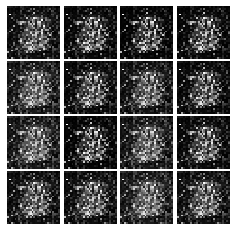

Epoch: 0, Iter: 260, D: 0.2683, G:0.6666


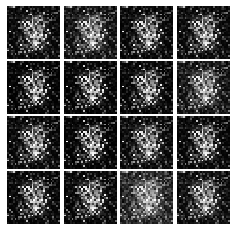

Epoch: 0, Iter: 280, D: 0.1129, G:0.5428


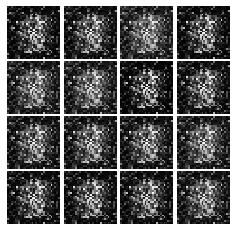

Epoch: 0, Iter: 300, D: 0.1542, G:0.6984


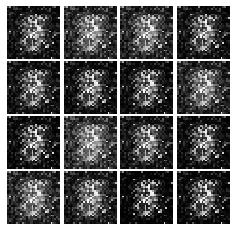

Epoch: 0, Iter: 320, D: 0.142, G:0.4519


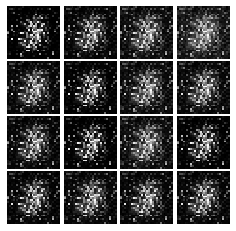

Epoch: 0, Iter: 340, D: 0.07936, G:0.5392


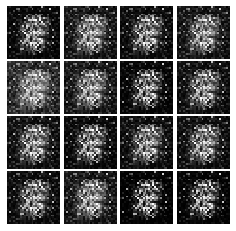

Epoch: 0, Iter: 360, D: 0.1276, G:0.4755


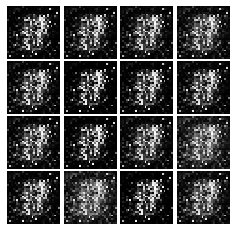

Epoch: 0, Iter: 380, D: 0.1861, G:0.6645


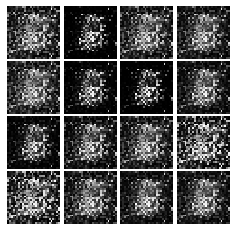

Epoch: 0, Iter: 400, D: 0.1708, G:0.8738


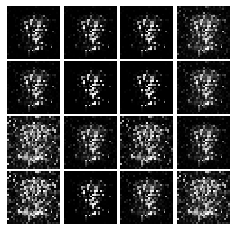

Epoch: 0, Iter: 420, D: 0.2117, G:0.4211


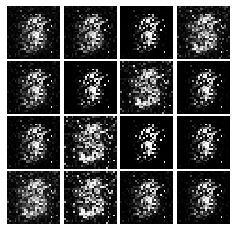

Epoch: 0, Iter: 440, D: 0.1222, G:0.3804


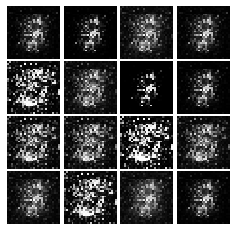

Epoch: 0, Iter: 460, D: 0.05988, G:0.4813


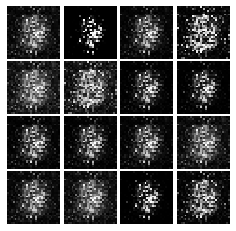

Epoch: 1, Iter: 480, D: 0.2536, G:0.07691


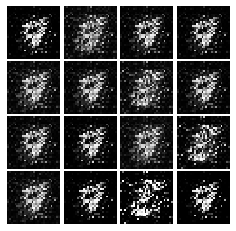

Epoch: 1, Iter: 500, D: 0.08952, G:0.4079


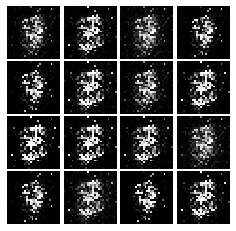

Epoch: 1, Iter: 520, D: 0.0597, G:0.7045


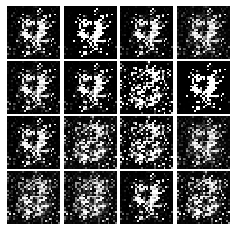

Epoch: 1, Iter: 540, D: 0.1635, G:0.333


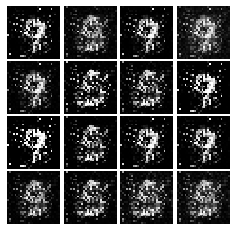

Epoch: 1, Iter: 560, D: 0.07104, G:0.4023


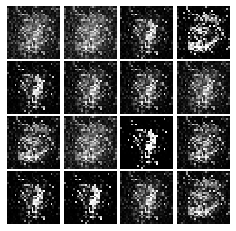

Epoch: 1, Iter: 580, D: 0.1369, G:0.4132


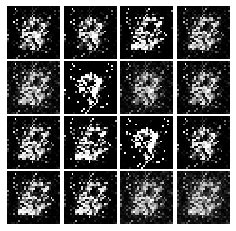

Epoch: 1, Iter: 600, D: 0.06487, G:0.6518


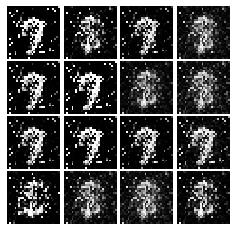

Epoch: 1, Iter: 620, D: 0.6024, G:1.013


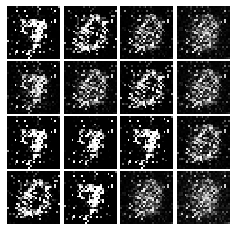

Epoch: 1, Iter: 640, D: 0.1064, G:0.3101


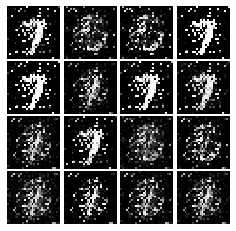

Epoch: 1, Iter: 660, D: 0.133, G:0.2011


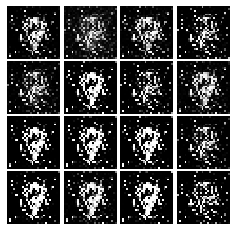

Epoch: 1, Iter: 680, D: 0.4357, G:0.3956


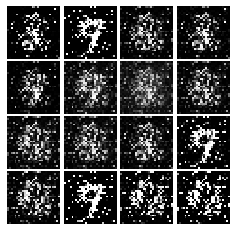

Epoch: 1, Iter: 700, D: 0.1123, G:0.5674


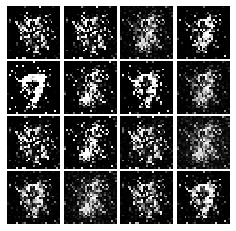

Epoch: 1, Iter: 720, D: 0.09522, G:0.5364


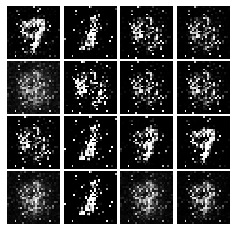

Epoch: 1, Iter: 740, D: 0.1292, G:0.5203


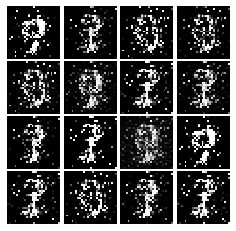

Epoch: 1, Iter: 760, D: 0.4282, G:0.4653


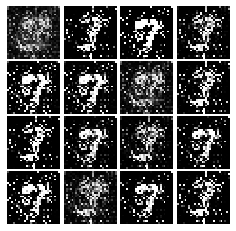

Epoch: 1, Iter: 780, D: 0.2669, G:1.403


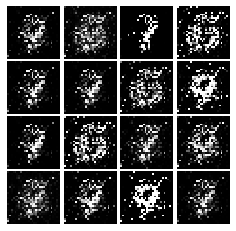

Epoch: 1, Iter: 800, D: 0.08427, G:0.505


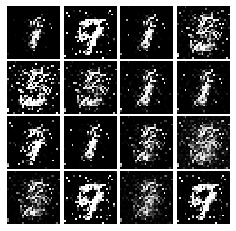

Epoch: 1, Iter: 820, D: 0.1514, G:0.3977


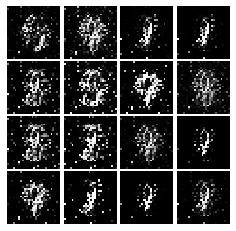

Epoch: 1, Iter: 840, D: 0.1042, G:0.3968


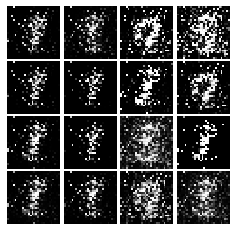

Epoch: 1, Iter: 860, D: 0.05022, G:0.2051


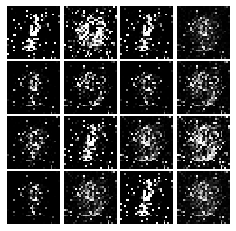

Epoch: 1, Iter: 880, D: 0.1006, G:0.3622


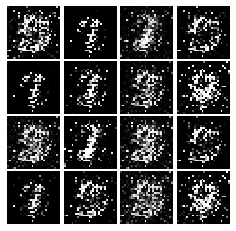

Epoch: 1, Iter: 900, D: 0.1132, G:0.2315


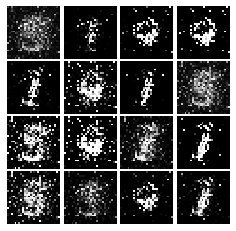

Epoch: 1, Iter: 920, D: 0.1794, G:0.3027


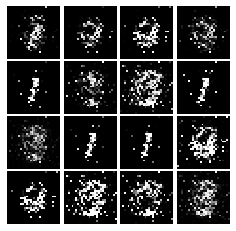

Epoch: 2, Iter: 940, D: 0.1358, G:0.4376


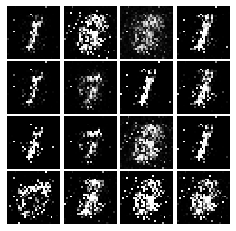

Epoch: 2, Iter: 960, D: 0.1143, G:0.4761


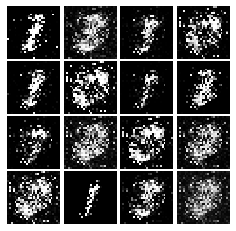

Epoch: 2, Iter: 980, D: 0.1378, G:0.3798


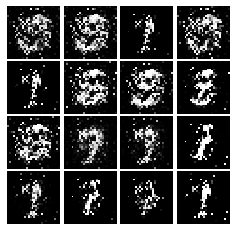

Epoch: 2, Iter: 1000, D: 0.1237, G:0.3163


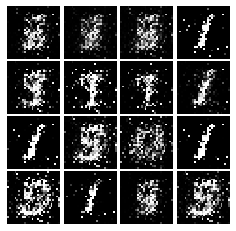

Epoch: 2, Iter: 1020, D: 0.1428, G:0.3341


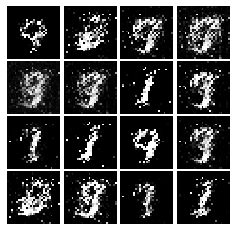

Epoch: 2, Iter: 1040, D: 0.1382, G:0.3509


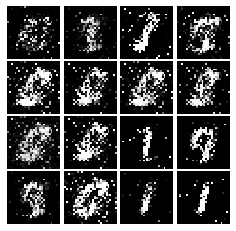

Epoch: 2, Iter: 1060, D: 0.1502, G:0.2166


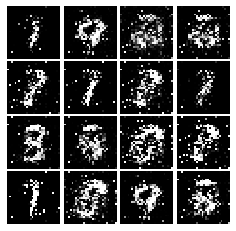

Epoch: 2, Iter: 1080, D: 0.1509, G:0.3114


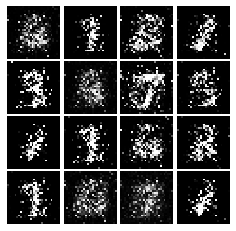

Epoch: 2, Iter: 1100, D: 0.1535, G:0.2304


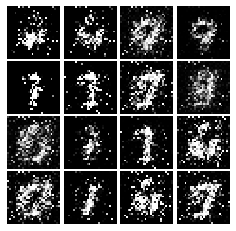

Epoch: 2, Iter: 1120, D: 0.1578, G:0.4161


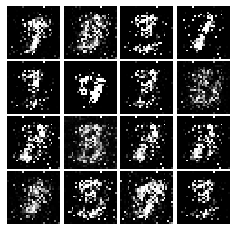

Epoch: 2, Iter: 1140, D: 1.029, G:0.3695


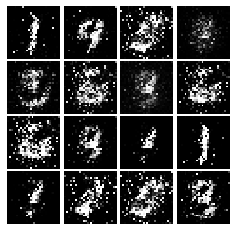

Epoch: 2, Iter: 1160, D: 0.1783, G:0.2241


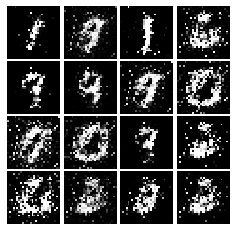

Epoch: 2, Iter: 1180, D: 0.1813, G:0.2793


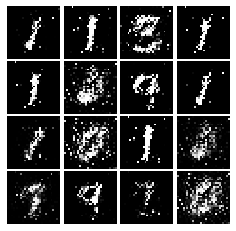

Epoch: 2, Iter: 1200, D: 0.1633, G:0.3246


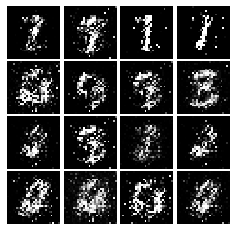

Epoch: 2, Iter: 1220, D: 0.2202, G:0.3094


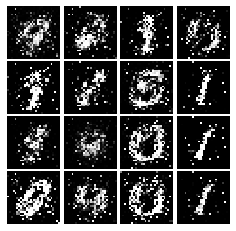

Epoch: 2, Iter: 1240, D: 0.2024, G:0.2438


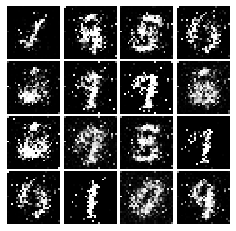

Epoch: 2, Iter: 1260, D: 0.142, G:0.2841


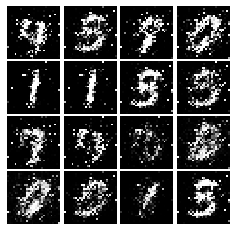

Epoch: 2, Iter: 1280, D: 0.1814, G:0.2446


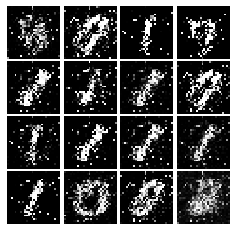

Epoch: 2, Iter: 1300, D: 0.159, G:0.2736


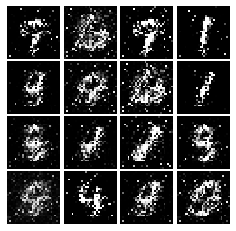

Epoch: 2, Iter: 1320, D: 0.1948, G:0.2001


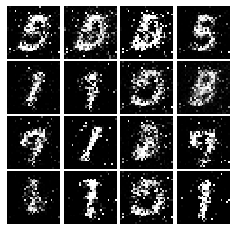

Epoch: 2, Iter: 1340, D: 0.2214, G:0.3081


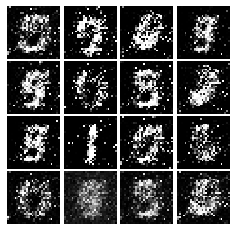

Epoch: 2, Iter: 1360, D: 0.1726, G:0.3026


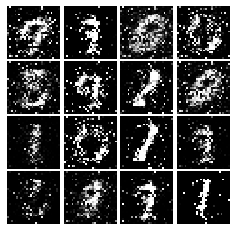

Epoch: 2, Iter: 1380, D: 0.1795, G:0.2372


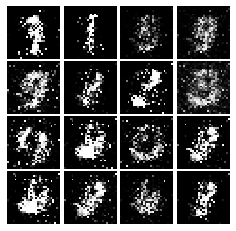

Epoch: 2, Iter: 1400, D: 0.1664, G:0.3956


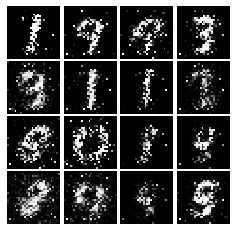

Epoch: 3, Iter: 1420, D: 0.197, G:0.2069


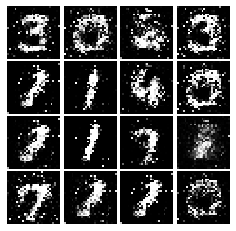

Epoch: 3, Iter: 1440, D: 0.1866, G:0.2309


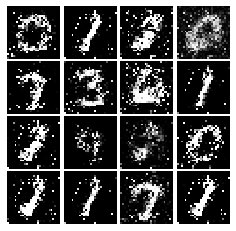

Epoch: 3, Iter: 1460, D: 0.1695, G:0.2502


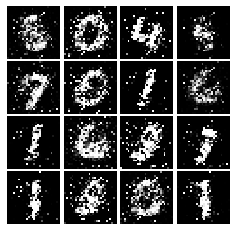

Epoch: 3, Iter: 1480, D: 0.1707, G:0.262


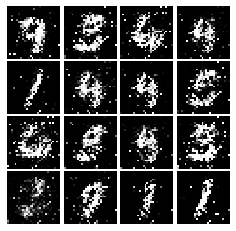

Epoch: 3, Iter: 1500, D: 0.1744, G:0.2756


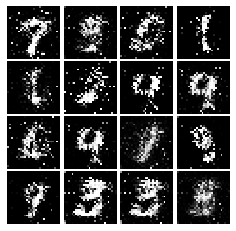

Epoch: 3, Iter: 1520, D: 0.1692, G:0.3469


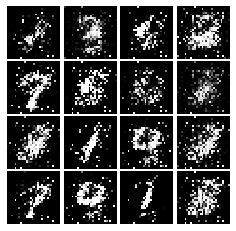

Epoch: 3, Iter: 1540, D: 0.2074, G:0.4005


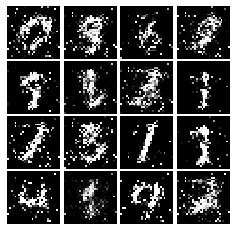

Epoch: 3, Iter: 1560, D: 0.1673, G:0.4319


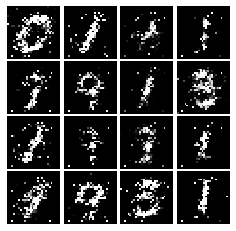

Epoch: 3, Iter: 1580, D: 0.1981, G:0.2199


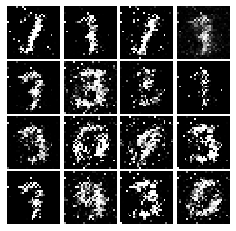

Epoch: 3, Iter: 1600, D: 0.1833, G:0.2484


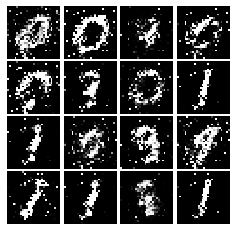

Epoch: 3, Iter: 1620, D: 0.1373, G:0.3143


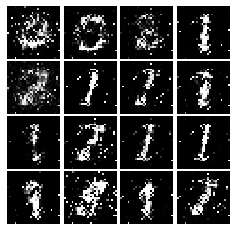

Epoch: 3, Iter: 1640, D: 0.1927, G:0.2307


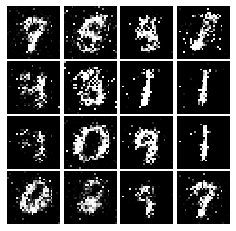

Epoch: 3, Iter: 1660, D: 0.1688, G:0.2829


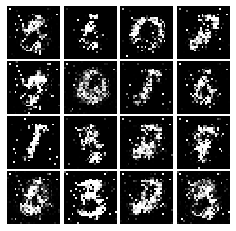

Epoch: 3, Iter: 1680, D: 0.1685, G:0.3319


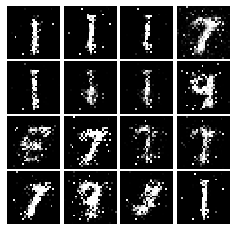

Epoch: 3, Iter: 1700, D: 0.1886, G:0.2022


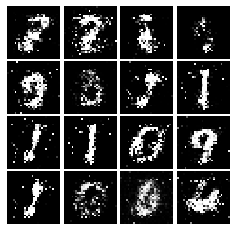

Epoch: 3, Iter: 1720, D: 0.1861, G:0.2377


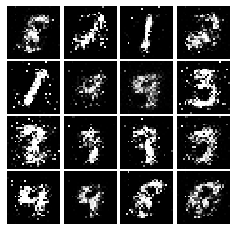

Epoch: 3, Iter: 1740, D: 0.1813, G:0.2326


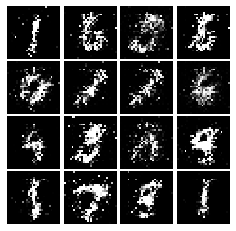

Epoch: 3, Iter: 1760, D: 0.1637, G:0.2673


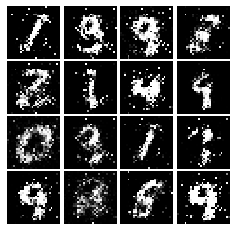

Epoch: 3, Iter: 1780, D: 0.1703, G:0.2564


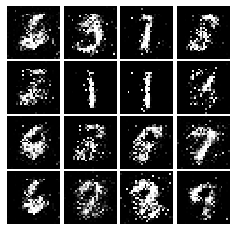

Epoch: 3, Iter: 1800, D: 0.2, G:0.2445


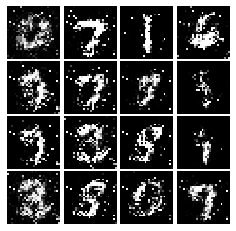

Epoch: 3, Iter: 1820, D: 0.205, G:0.2291


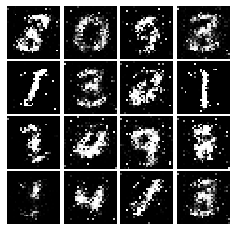

Epoch: 3, Iter: 1840, D: 0.2341, G:0.2142


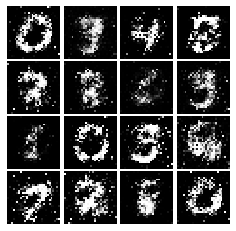

Epoch: 3, Iter: 1860, D: 0.2214, G:0.2225


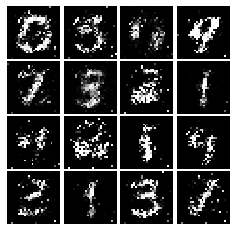

Epoch: 4, Iter: 1880, D: 0.1971, G:0.1861


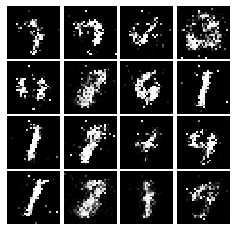

Epoch: 4, Iter: 1900, D: 0.2389, G:0.21


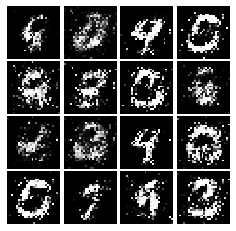

Epoch: 4, Iter: 1920, D: 0.201, G:0.1754


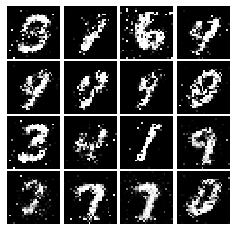

Epoch: 4, Iter: 1940, D: 0.1942, G:0.2047


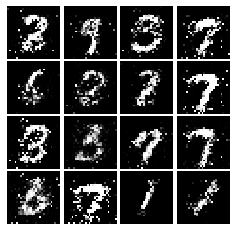

Epoch: 4, Iter: 1960, D: 0.1978, G:0.2189


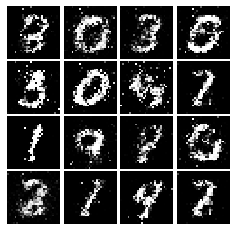

Epoch: 4, Iter: 1980, D: 0.2049, G:0.206


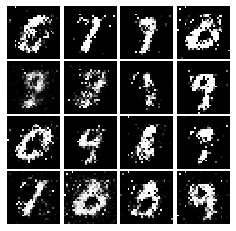

Epoch: 4, Iter: 2000, D: 0.2546, G:0.1918


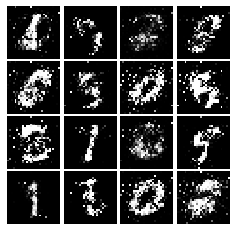

Epoch: 4, Iter: 2020, D: 0.2025, G:0.1745


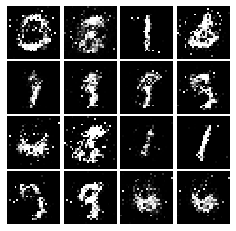

Epoch: 4, Iter: 2040, D: 0.2215, G:0.2395


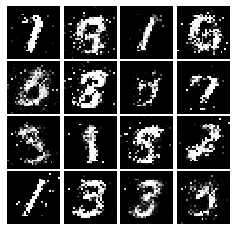

Epoch: 4, Iter: 2060, D: 0.29, G:0.1849


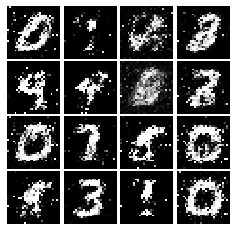

Epoch: 4, Iter: 2080, D: 0.2274, G:0.1951


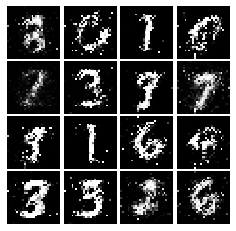

Epoch: 4, Iter: 2100, D: 0.2211, G:0.178


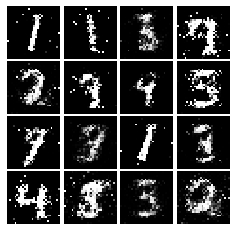

Epoch: 4, Iter: 2120, D: 0.2342, G:0.1785


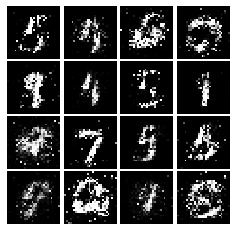

Epoch: 4, Iter: 2140, D: 0.2248, G:0.1924


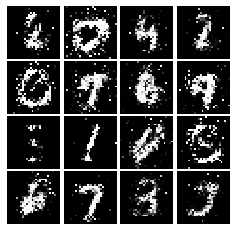

Epoch: 4, Iter: 2160, D: 0.2732, G:0.1356


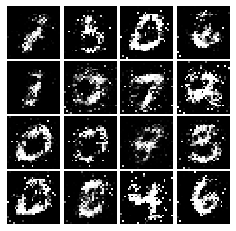

Epoch: 4, Iter: 2180, D: 0.2265, G:0.1877


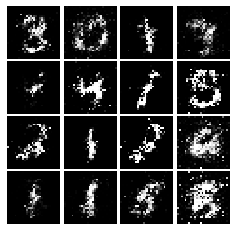

Epoch: 4, Iter: 2200, D: 0.2046, G:0.2536


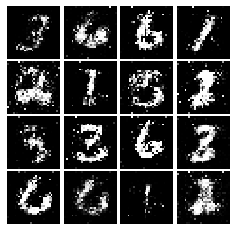

Epoch: 4, Iter: 2220, D: 0.2168, G:0.1651


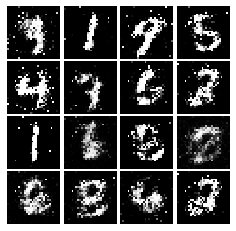

Epoch: 4, Iter: 2240, D: 0.2094, G:0.1671


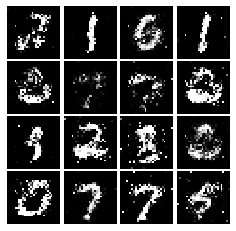

Epoch: 4, Iter: 2260, D: 0.225, G:0.1855


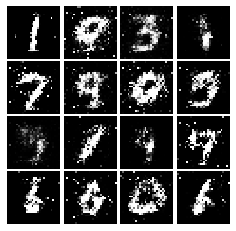

Epoch: 4, Iter: 2280, D: 0.212, G:0.237


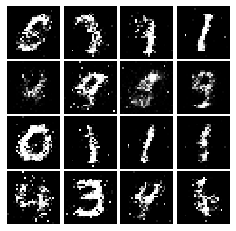

Epoch: 4, Iter: 2300, D: 0.2013, G:0.215


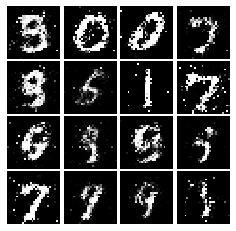

Epoch: 4, Iter: 2320, D: 0.2132, G:0.1779


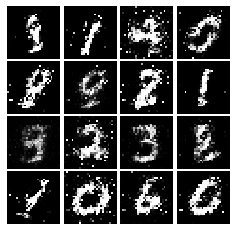

Epoch: 4, Iter: 2340, D: 0.2064, G:0.2505


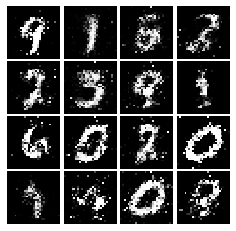

Epoch: 5, Iter: 2360, D: 0.2115, G:0.2569


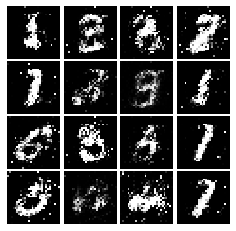

Epoch: 5, Iter: 2380, D: 0.2051, G:0.1747


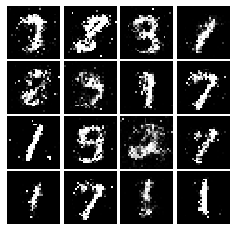

Epoch: 5, Iter: 2400, D: 0.2146, G:0.1683


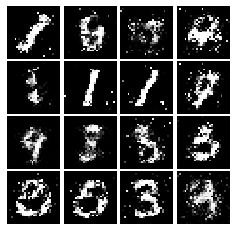

Epoch: 5, Iter: 2420, D: 0.2213, G:0.2036


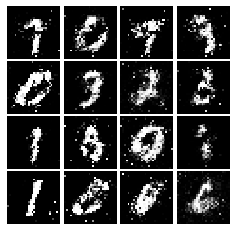

Epoch: 5, Iter: 2440, D: 0.2173, G:0.1753


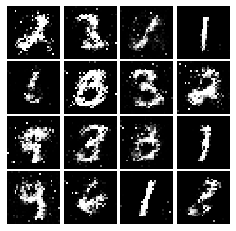

Epoch: 5, Iter: 2460, D: 0.1954, G:0.1994


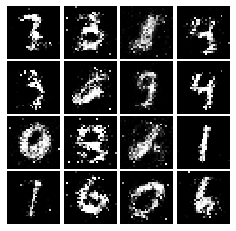

Epoch: 5, Iter: 2480, D: 0.1995, G:0.1901


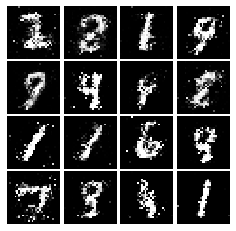

Epoch: 5, Iter: 2500, D: 0.1864, G:0.1991


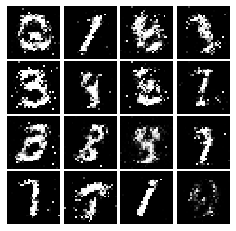

Epoch: 5, Iter: 2520, D: 0.2476, G:0.2091


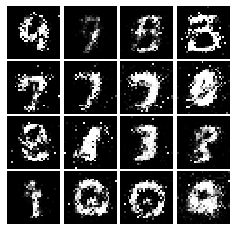

Epoch: 5, Iter: 2540, D: 0.2255, G:0.1702


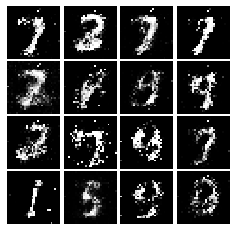

Epoch: 5, Iter: 2560, D: 0.2261, G:0.1938


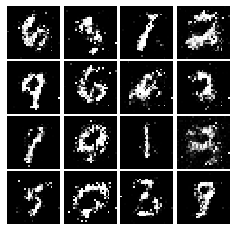

Epoch: 5, Iter: 2580, D: 0.2155, G:0.2251


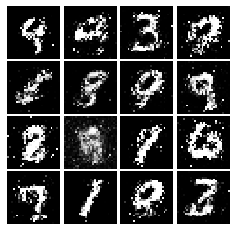

Epoch: 5, Iter: 2600, D: 0.2607, G:0.2074


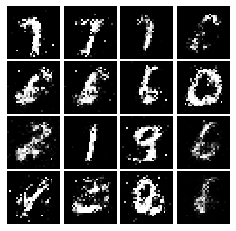

Epoch: 5, Iter: 2620, D: 0.216, G:0.2034


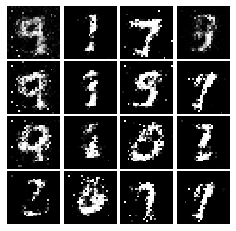

Epoch: 5, Iter: 2640, D: 0.2197, G:0.2244


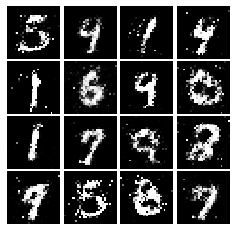

Epoch: 5, Iter: 2660, D: 0.2386, G:0.1844


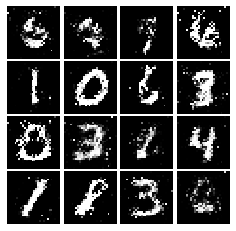

Epoch: 5, Iter: 2680, D: 0.215, G:0.2052


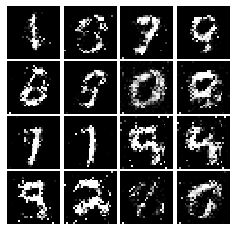

Epoch: 5, Iter: 2700, D: 0.2116, G:0.1803


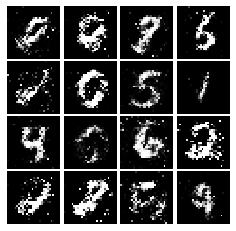

Epoch: 5, Iter: 2720, D: 0.2291, G:0.1794


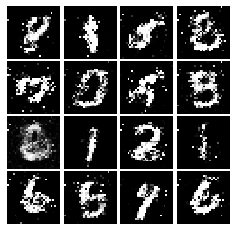

Epoch: 5, Iter: 2740, D: 0.2202, G:0.1594


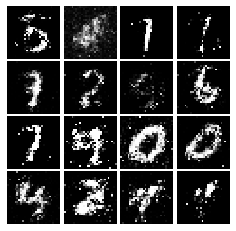

Epoch: 5, Iter: 2760, D: 0.2205, G:0.1617


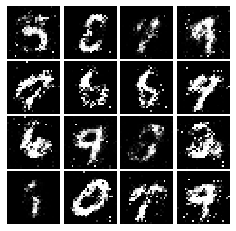

Epoch: 5, Iter: 2780, D: 0.2305, G:0.1641


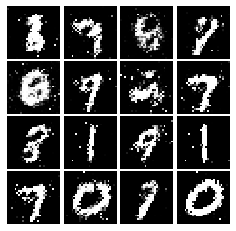

Epoch: 5, Iter: 2800, D: 0.2133, G:0.192


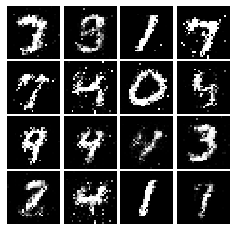

Epoch: 6, Iter: 2820, D: 0.2299, G:0.1873


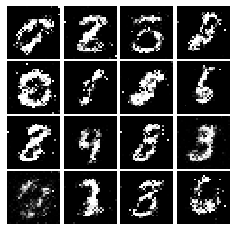

Epoch: 6, Iter: 2840, D: 0.2264, G:0.1834


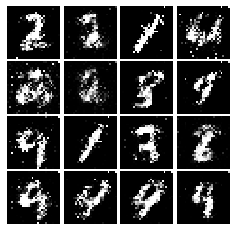

Epoch: 6, Iter: 2860, D: 0.229, G:0.1834


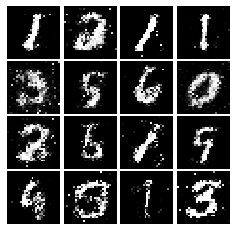

Epoch: 6, Iter: 2880, D: 0.2108, G:0.2067


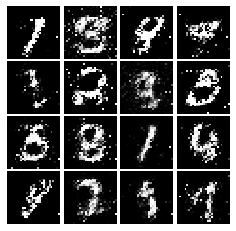

Epoch: 6, Iter: 2900, D: 0.2246, G:0.1804


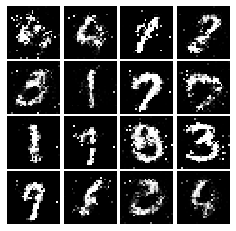

Epoch: 6, Iter: 2920, D: 0.2326, G:0.1666


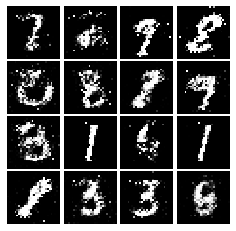

Epoch: 6, Iter: 2940, D: 0.2416, G:0.1833


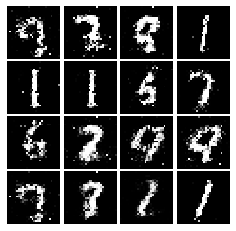

Epoch: 6, Iter: 2960, D: 0.2334, G:0.1702


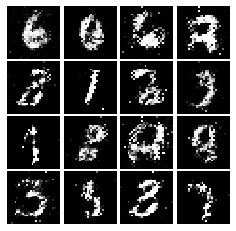

Epoch: 6, Iter: 2980, D: 0.2095, G:0.1787


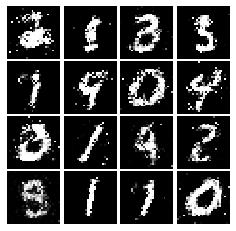

Epoch: 6, Iter: 3000, D: 0.2067, G:0.1847


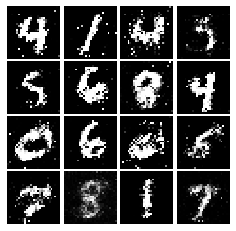

Epoch: 6, Iter: 3020, D: 0.2058, G:0.2111


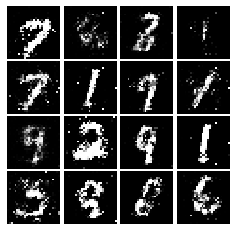

Epoch: 6, Iter: 3040, D: 0.2253, G:0.2423


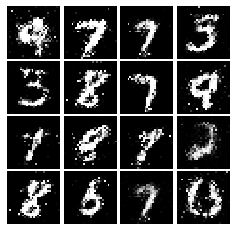

Epoch: 6, Iter: 3060, D: 0.2374, G:0.1749


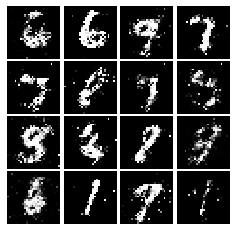

Epoch: 6, Iter: 3080, D: 0.2126, G:0.1801


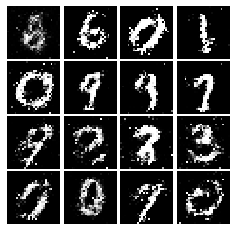

Epoch: 6, Iter: 3100, D: 0.2161, G:0.1823


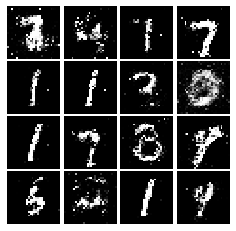

Epoch: 6, Iter: 3120, D: 0.2463, G:0.1685


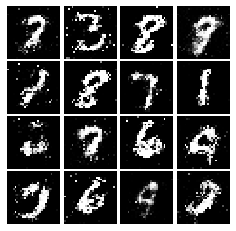

Epoch: 6, Iter: 3140, D: 0.2423, G:0.1697


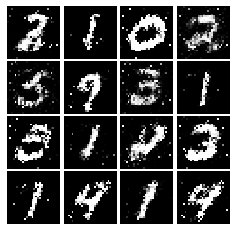

Epoch: 6, Iter: 3160, D: 0.2201, G:0.1916


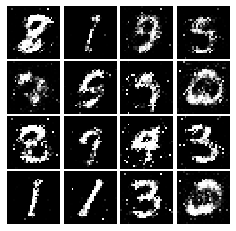

Epoch: 6, Iter: 3180, D: 0.2198, G:0.1685


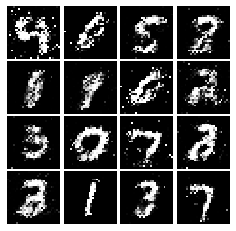

Epoch: 6, Iter: 3200, D: 0.2105, G:0.1762


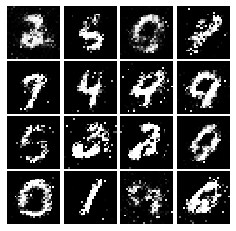

Epoch: 6, Iter: 3220, D: 0.2386, G:0.2231


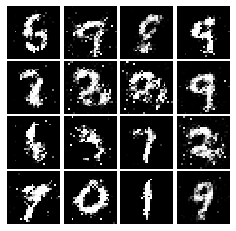

Epoch: 6, Iter: 3240, D: 0.2033, G:0.1419


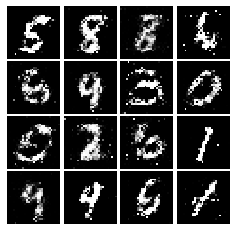

Epoch: 6, Iter: 3260, D: 0.2633, G:0.1775


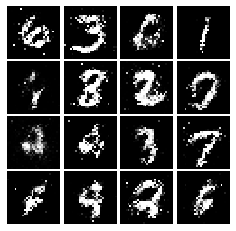

Epoch: 6, Iter: 3280, D: 0.2314, G:0.1622


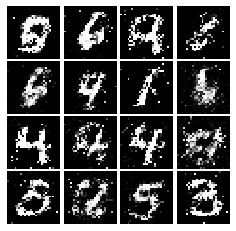

Epoch: 7, Iter: 3300, D: 0.1832, G:0.1908


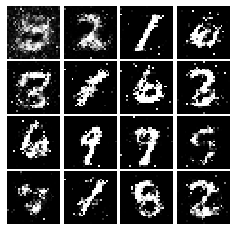

Epoch: 7, Iter: 3320, D: 0.2011, G:0.1955


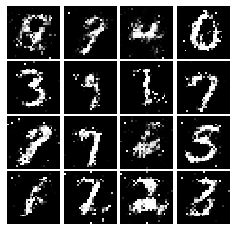

Epoch: 7, Iter: 3340, D: 0.2218, G:0.1986


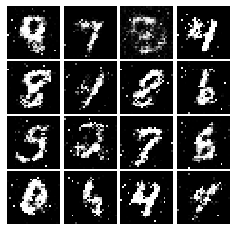

Epoch: 7, Iter: 3360, D: 0.2213, G:0.1606


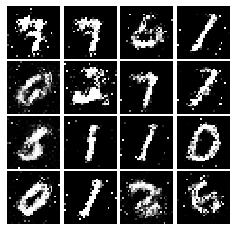

Epoch: 7, Iter: 3380, D: 0.2162, G:0.1616


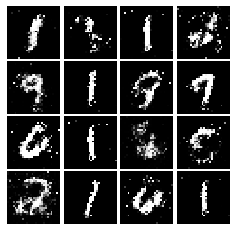

Epoch: 7, Iter: 3400, D: 0.2345, G:0.162


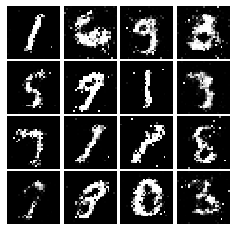

Epoch: 7, Iter: 3420, D: 0.2088, G:0.1847


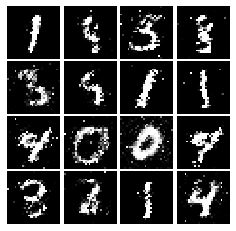

Epoch: 7, Iter: 3440, D: 0.2203, G:0.2544


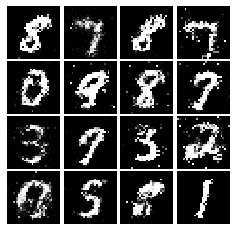

Epoch: 7, Iter: 3460, D: 0.22, G:0.182


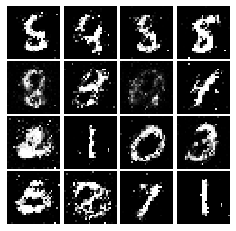

Epoch: 7, Iter: 3480, D: 0.2153, G:0.1659


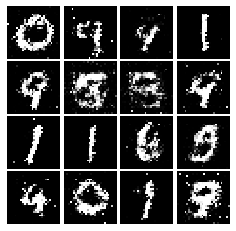

Epoch: 7, Iter: 3500, D: 0.2018, G:0.1861


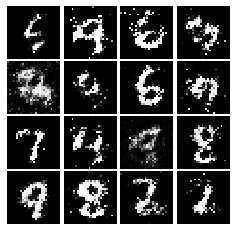

Epoch: 7, Iter: 3520, D: 0.2254, G:0.1561


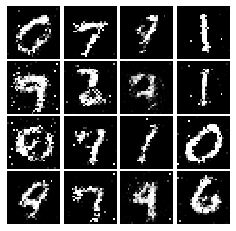

Epoch: 7, Iter: 3540, D: 0.2004, G:0.179


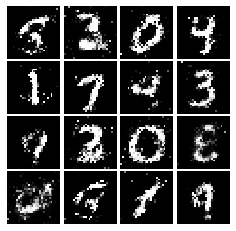

Epoch: 7, Iter: 3560, D: 0.2138, G:0.2002


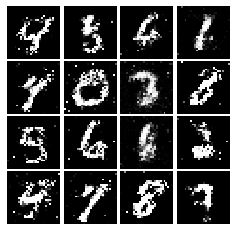

Epoch: 7, Iter: 3580, D: 0.2306, G:0.1783


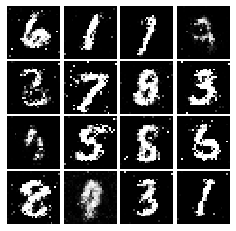

Epoch: 7, Iter: 3600, D: 0.2285, G:0.1971


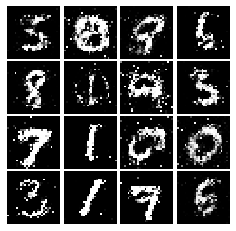

Epoch: 7, Iter: 3620, D: 0.209, G:0.1908


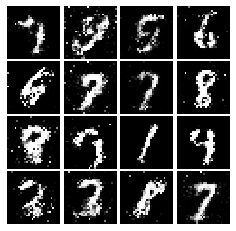

Epoch: 7, Iter: 3640, D: 0.2458, G:0.1788


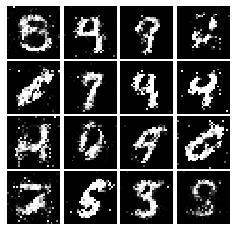

Epoch: 7, Iter: 3660, D: 0.2234, G:0.1892


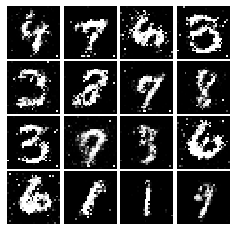

Epoch: 7, Iter: 3680, D: 0.222, G:0.1702


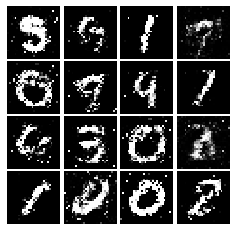

Epoch: 7, Iter: 3700, D: 0.2222, G:0.1652


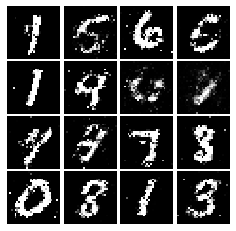

Epoch: 7, Iter: 3720, D: 0.223, G:0.1699


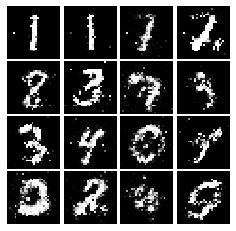

Epoch: 7, Iter: 3740, D: 0.2402, G:0.1885


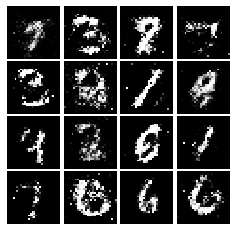

Epoch: 8, Iter: 3760, D: 0.2298, G:0.1693


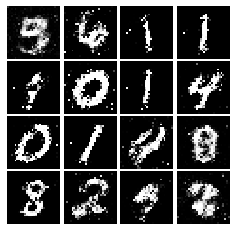

Epoch: 8, Iter: 3780, D: 0.214, G:0.1689


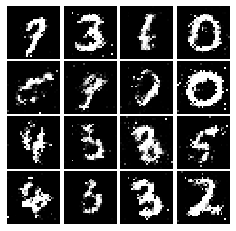

Epoch: 8, Iter: 3800, D: 0.2307, G:0.1776


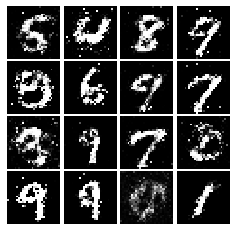

Epoch: 8, Iter: 3820, D: 0.2102, G:0.1707


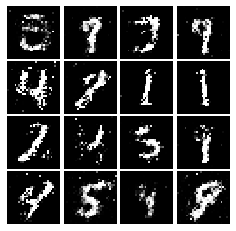

Epoch: 8, Iter: 3840, D: 0.2119, G:0.1818


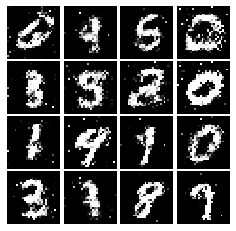

Epoch: 8, Iter: 3860, D: 0.2093, G:0.1757


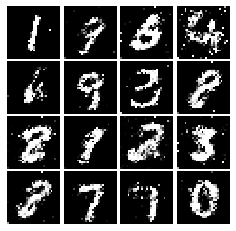

Epoch: 8, Iter: 3880, D: 0.2146, G:0.1649


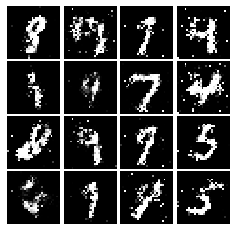

Epoch: 8, Iter: 3900, D: 0.223, G:0.1988


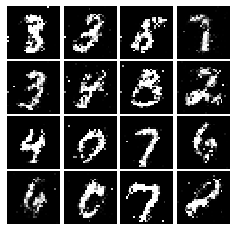

Epoch: 8, Iter: 3920, D: 0.2146, G:0.1964


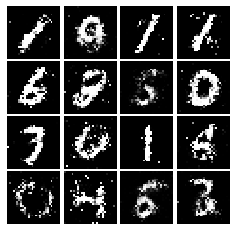

Epoch: 8, Iter: 3940, D: 0.2321, G:0.147


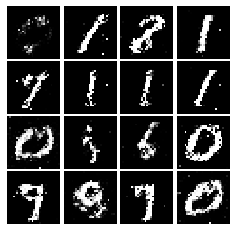

Epoch: 8, Iter: 3960, D: 0.2486, G:0.2127


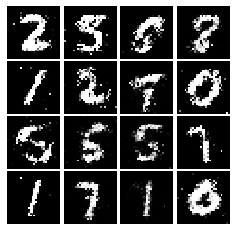

Epoch: 8, Iter: 3980, D: 0.2272, G:0.1729


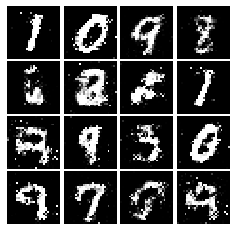

Epoch: 8, Iter: 4000, D: 0.2055, G:0.2182


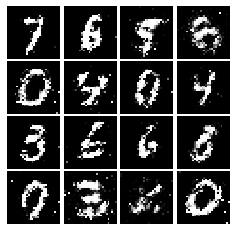

Epoch: 8, Iter: 4020, D: 0.2144, G:0.1693


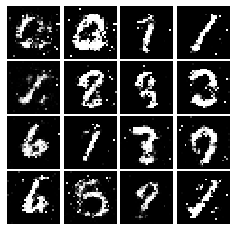

Epoch: 8, Iter: 4040, D: 0.23, G:0.1648


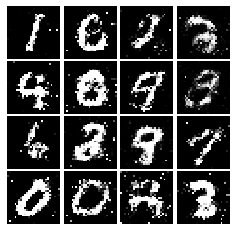

Epoch: 8, Iter: 4060, D: 0.2084, G:0.1617


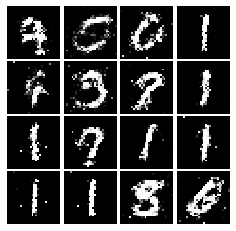

Epoch: 8, Iter: 4080, D: 0.2384, G:0.1767


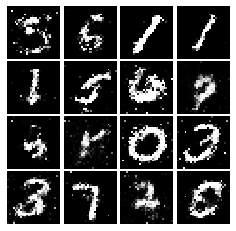

Epoch: 8, Iter: 4100, D: 0.2157, G:0.1859


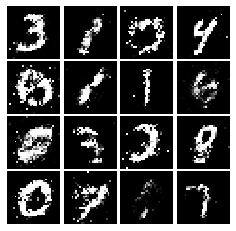

Epoch: 8, Iter: 4120, D: 0.2131, G:0.1838


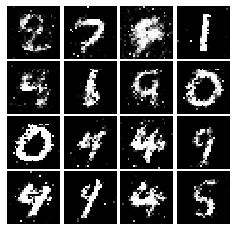

Epoch: 8, Iter: 4140, D: 0.213, G:0.1986


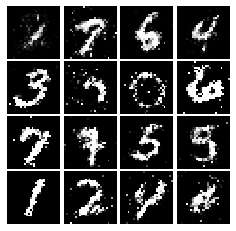

Epoch: 8, Iter: 4160, D: 0.2301, G:0.1666


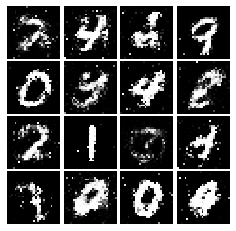

Epoch: 8, Iter: 4180, D: 0.231, G:0.1569


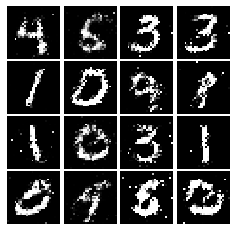

Epoch: 8, Iter: 4200, D: 0.213, G:0.2108


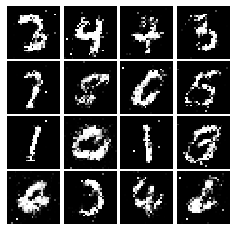

Epoch: 8, Iter: 4220, D: 0.2003, G:0.1856


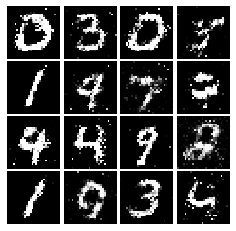

Epoch: 9, Iter: 4240, D: 0.2405, G:0.1562


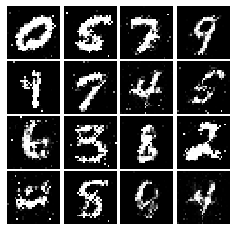

Epoch: 9, Iter: 4260, D: 0.2375, G:0.1572


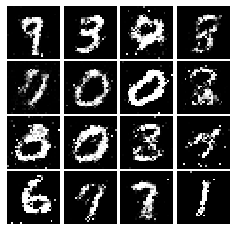

Epoch: 9, Iter: 4280, D: 0.2378, G:0.1841


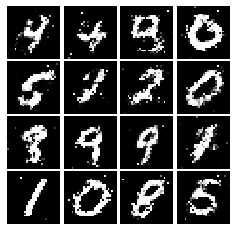

Epoch: 9, Iter: 4300, D: 0.2512, G:0.1837


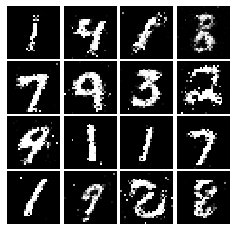

Epoch: 9, Iter: 4320, D: 0.224, G:0.1373


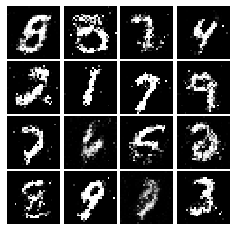

Epoch: 9, Iter: 4340, D: 0.2435, G:0.1794


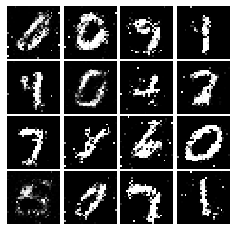

Epoch: 9, Iter: 4360, D: 0.2501, G:0.1522


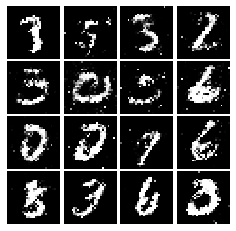

Epoch: 9, Iter: 4380, D: 0.258, G:0.148


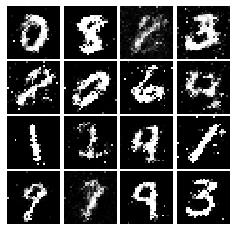

Epoch: 9, Iter: 4400, D: 0.2061, G:0.1725


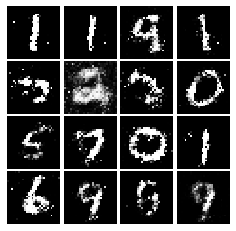

Epoch: 9, Iter: 4420, D: 0.2086, G:0.1658


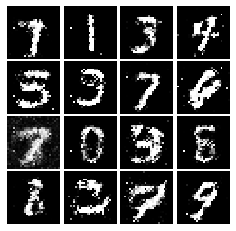

Epoch: 9, Iter: 4440, D: 0.2259, G:0.1736


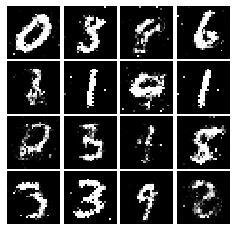

Epoch: 9, Iter: 4460, D: 0.2536, G:0.1757


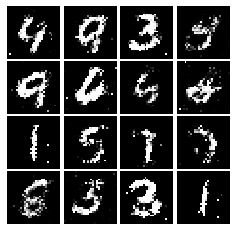

Epoch: 9, Iter: 4480, D: 0.224, G:0.1726


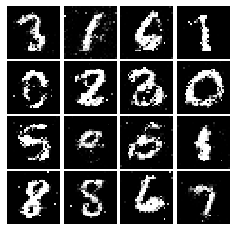

Epoch: 9, Iter: 4500, D: 0.2707, G:0.1434


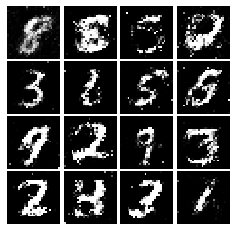

Epoch: 9, Iter: 4520, D: 0.2377, G:0.153


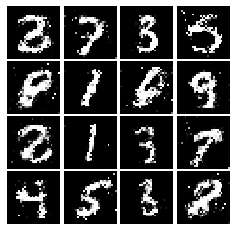

Epoch: 9, Iter: 4540, D: 0.2593, G:0.1725


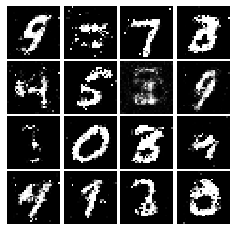

Epoch: 9, Iter: 4560, D: 0.2106, G:0.1992


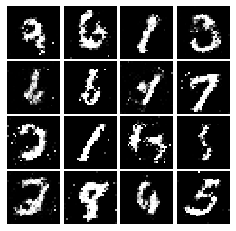

Epoch: 9, Iter: 4580, D: 0.2095, G:0.1515


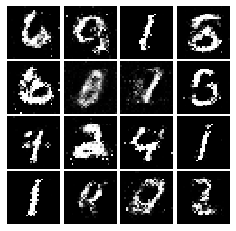

Epoch: 9, Iter: 4600, D: 0.2245, G:0.1638


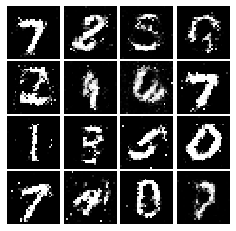

Epoch: 9, Iter: 4620, D: 0.2336, G:0.1854


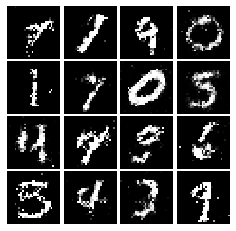

Epoch: 9, Iter: 4640, D: 0.2278, G:0.1657


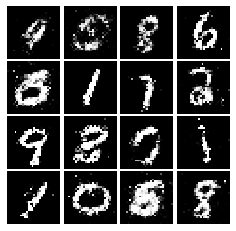

Epoch: 9, Iter: 4660, D: 0.2237, G:0.1885


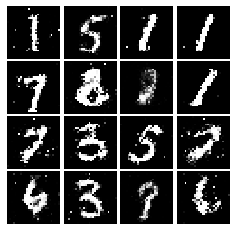

Epoch: 9, Iter: 4680, D: 0.2439, G:0.1603


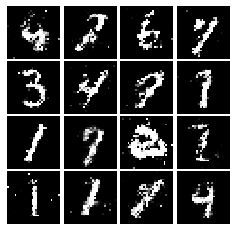

Final images


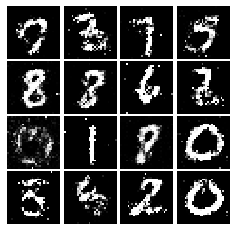

In [95]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [113]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Reshape((28, 28,1), input_shape=(784,)),
        tf.keras.layers.Conv2D(filters=32,kernel_size=5,strides=1, padding="valid", activation=leaky_relu),
        tf.keras.layers.MaxPool2D(pool_size=2,strides=2),
        tf.keras.layers.Conv2D(filters=64,kernel_size=5,strides=1, padding="valid", activation=leaky_relu),
        tf.keras.layers.MaxPool2D(pool_size=2,strides=2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(units=4*4*64, activation=leaky_relu),
        tf.keras.layers.Dense(units=1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [122]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(units=1024, activation="relu", input_shape=(noise_dim,)),
        tf.keras.layers.BatchNormalization(trainable=True),
        tf.keras.layers.Dense(units=7*7*128, activation="relu"),
        tf.keras.layers.BatchNormalization(trainable=True),
        tf.keras.layers.Reshape((7,7, 128)),
        tf.keras.layers.Conv2DTranspose(filters=64, kernel_size=4, strides=2,padding="SAME",activation="relu"),
        tf.keras.layers.BatchNormalization(trainable=True),
        tf.keras.layers.Conv2DTranspose(filters=1, kernel_size=4, strides=2,padding="SAME", activation="tanh")
    ])

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.45, G:0.6591


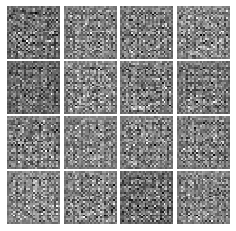

Epoch: 0, Iter: 20, D: 0.9227, G:2.425


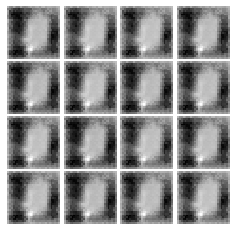

Epoch: 0, Iter: 40, D: 0.4656, G:2.922


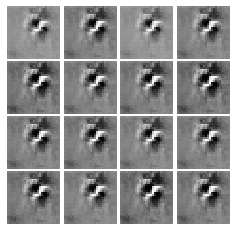

Epoch: 0, Iter: 60, D: 3.017, G:1.607


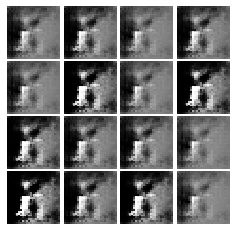

Epoch: 0, Iter: 80, D: 0.2461, G:3.318


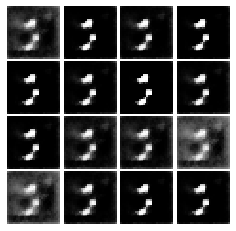

Epoch: 0, Iter: 100, D: 0.9911, G:2.196


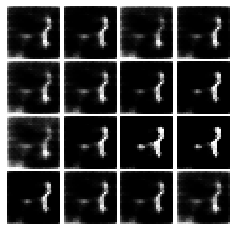

Epoch: 0, Iter: 120, D: 0.455, G:4.696


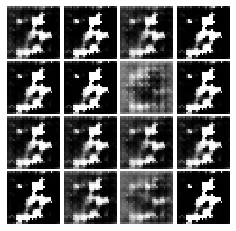

Epoch: 0, Iter: 140, D: 0.844, G:2.315


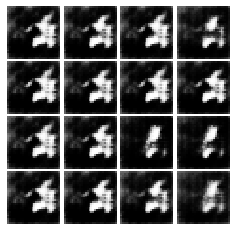

Epoch: 0, Iter: 160, D: 0.8619, G:1.181


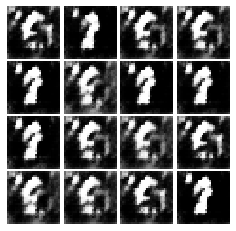

Epoch: 0, Iter: 180, D: 1.361, G:3.15


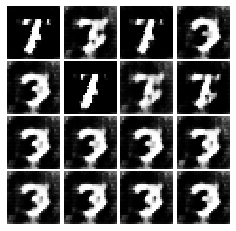

Epoch: 0, Iter: 200, D: 0.8661, G:5.581


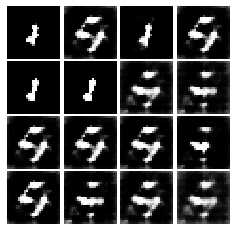

Epoch: 0, Iter: 220, D: 1.259, G:2.985


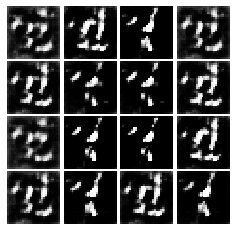

Epoch: 0, Iter: 240, D: 0.5806, G:2.12


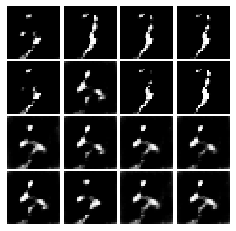

Epoch: 0, Iter: 260, D: 0.379, G:2.912


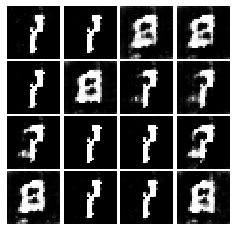

Epoch: 0, Iter: 280, D: 0.4295, G:1.825


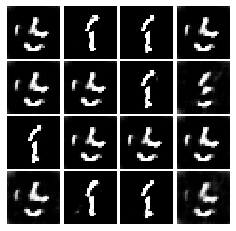

Epoch: 0, Iter: 300, D: 2.714, G:3.191


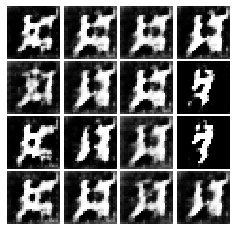

Epoch: 0, Iter: 320, D: 2.179, G:8.612


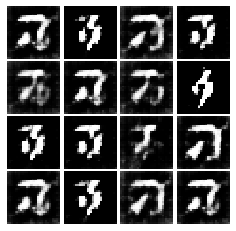

Epoch: 0, Iter: 340, D: 0.6395, G:1.807


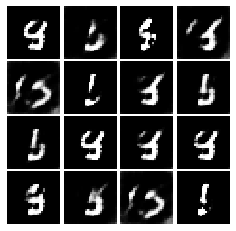

Epoch: 0, Iter: 360, D: 0.9235, G:1.728


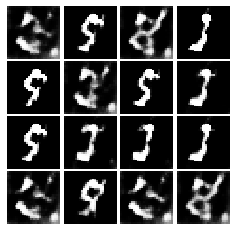

Epoch: 0, Iter: 380, D: 0.6361, G:2.711


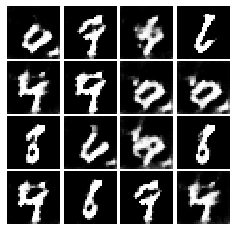

Epoch: 0, Iter: 400, D: 0.3074, G:3.531


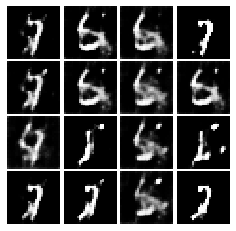

Epoch: 0, Iter: 420, D: 0.5592, G:2.985


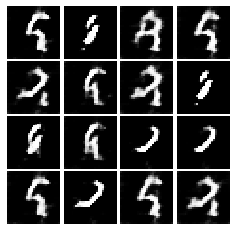

Epoch: 0, Iter: 440, D: 0.9148, G:3.463


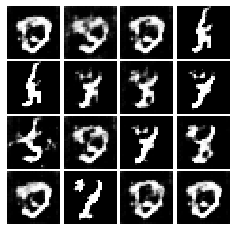

Epoch: 0, Iter: 460, D: 0.6778, G:5.611


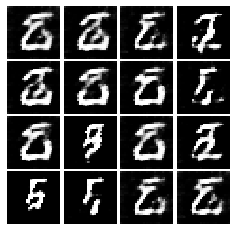

Epoch: 1, Iter: 480, D: 0.3913, G:3.318


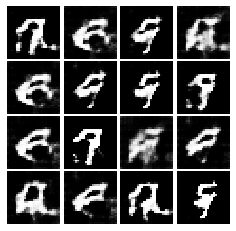

Epoch: 1, Iter: 500, D: 0.6333, G:2.48


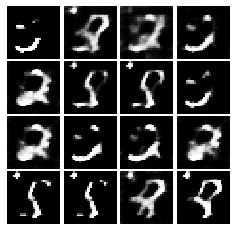

Epoch: 1, Iter: 520, D: 0.3878, G:3.176


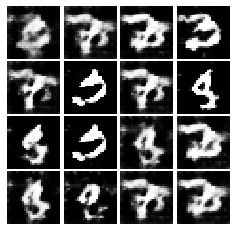

Epoch: 1, Iter: 540, D: 0.5362, G:1.422


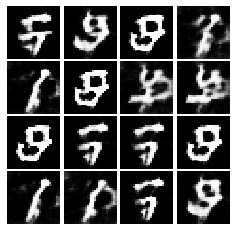

Epoch: 1, Iter: 560, D: 0.5946, G:4.466


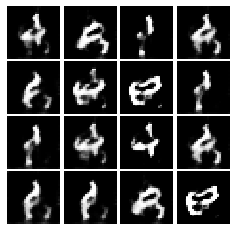

Epoch: 1, Iter: 580, D: 0.498, G:3.242


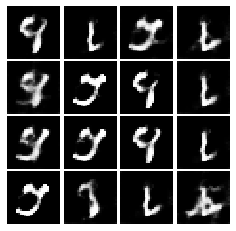

Epoch: 1, Iter: 600, D: 0.5265, G:2.884


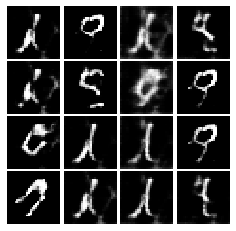

Epoch: 1, Iter: 620, D: 0.4657, G:2.853


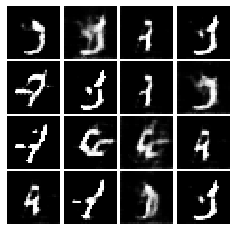

Epoch: 1, Iter: 640, D: 0.5283, G:3.712


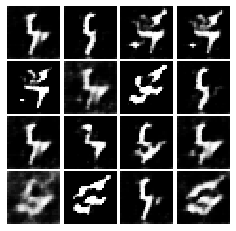

Epoch: 1, Iter: 660, D: 0.3264, G:2.982


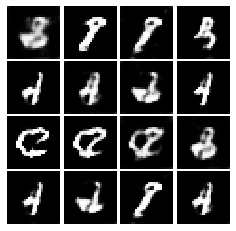

Epoch: 1, Iter: 680, D: 0.5431, G:2.753


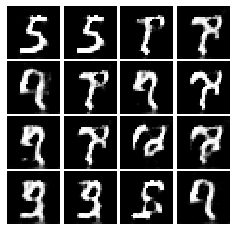

Epoch: 1, Iter: 700, D: 0.2972, G:2.961


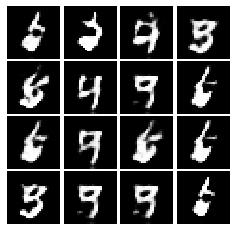

Epoch: 1, Iter: 720, D: 0.3141, G:3.335


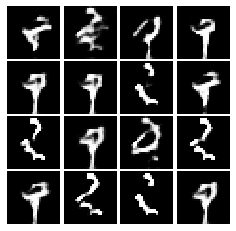

Epoch: 1, Iter: 740, D: 0.2269, G:4.027


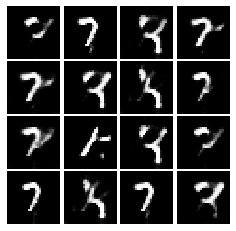

Epoch: 1, Iter: 760, D: 0.6183, G:2.546


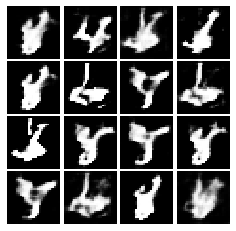

Epoch: 1, Iter: 780, D: 0.6376, G:1.588


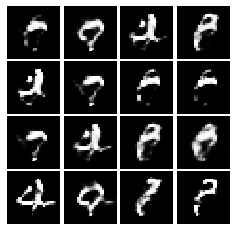

Epoch: 1, Iter: 800, D: 0.3631, G:3.565


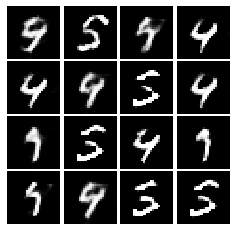

Epoch: 1, Iter: 820, D: 0.5791, G:3.659


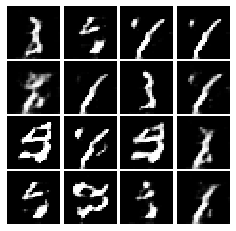

Epoch: 1, Iter: 840, D: 0.4026, G:2.798


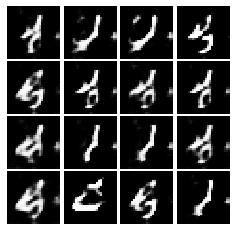

Epoch: 1, Iter: 860, D: 0.4794, G:3.758


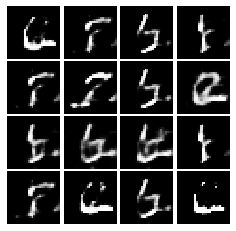

Epoch: 1, Iter: 880, D: 0.3772, G:3.751


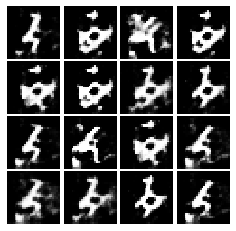

Epoch: 1, Iter: 900, D: 0.4337, G:2.759


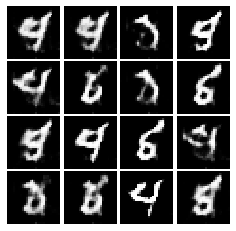

Epoch: 1, Iter: 920, D: 0.8707, G:2.488


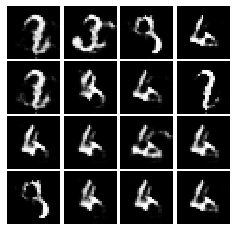

Epoch: 2, Iter: 940, D: 0.7104, G:2.349


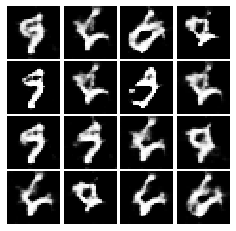

Epoch: 2, Iter: 960, D: 0.508, G:2.213


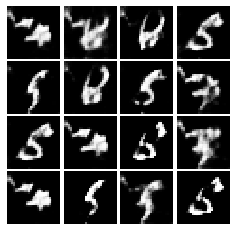

Epoch: 2, Iter: 980, D: 0.2936, G:2.346


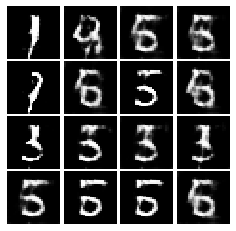

Epoch: 2, Iter: 1000, D: 0.4555, G:3.8


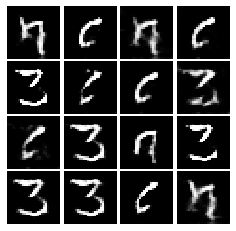

Epoch: 2, Iter: 1020, D: 0.5256, G:4.719


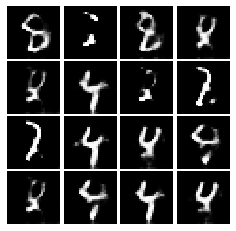

Epoch: 2, Iter: 1040, D: 0.3046, G:3.416


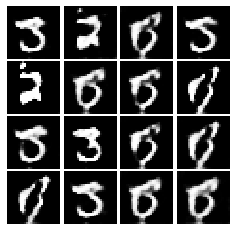

Epoch: 2, Iter: 1060, D: 0.2659, G:3.546


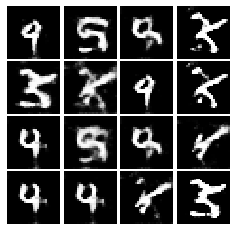

Epoch: 2, Iter: 1080, D: 0.312, G:2.084


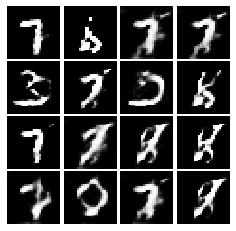

Epoch: 2, Iter: 1100, D: 0.4833, G:3.783


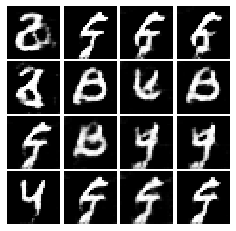

Epoch: 2, Iter: 1120, D: 0.4424, G:2.59


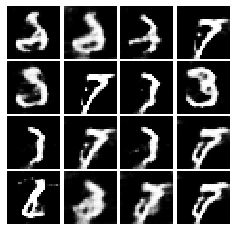

Epoch: 2, Iter: 1140, D: 0.3547, G:3.534


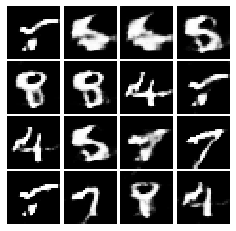

Epoch: 2, Iter: 1160, D: 0.6031, G:2.631


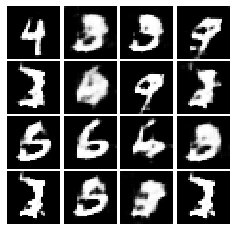

Epoch: 2, Iter: 1180, D: 0.4269, G:3.087


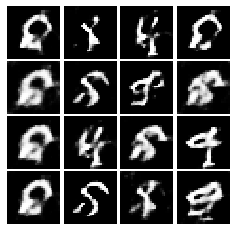

Epoch: 2, Iter: 1200, D: 0.9694, G:5.925


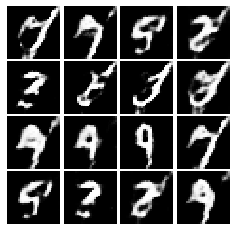

Epoch: 2, Iter: 1220, D: 0.6441, G:2.138


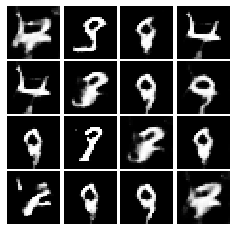

Epoch: 2, Iter: 1240, D: 0.3115, G:3.901


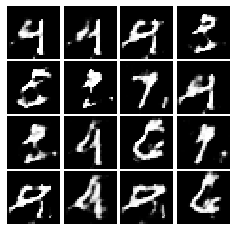

Epoch: 2, Iter: 1260, D: 0.3709, G:2.731


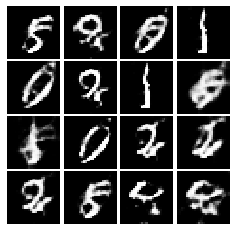

Epoch: 2, Iter: 1280, D: 0.5166, G:2.299


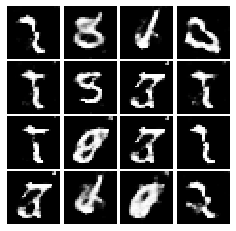

Epoch: 2, Iter: 1300, D: 0.6371, G:3.273


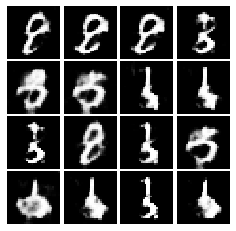

Epoch: 2, Iter: 1320, D: 0.4181, G:3.267


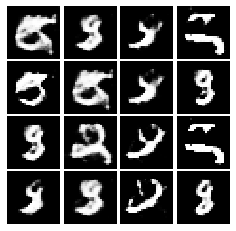

Epoch: 2, Iter: 1340, D: 0.2452, G:3.809


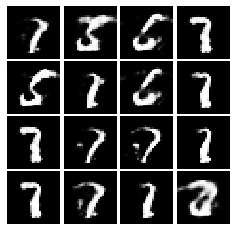

Epoch: 2, Iter: 1360, D: 0.4331, G:3.933


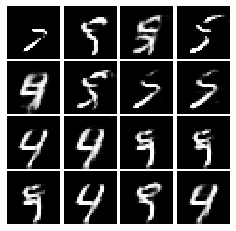

Epoch: 2, Iter: 1380, D: 0.5785, G:2.824


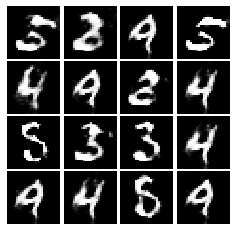

Epoch: 2, Iter: 1400, D: 0.1949, G:3.146


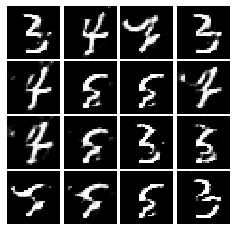

Epoch: 3, Iter: 1420, D: 0.4618, G:3.159


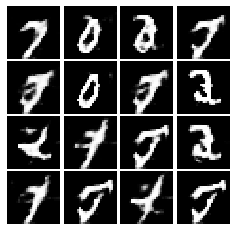

Epoch: 3, Iter: 1440, D: 0.2881, G:3.749


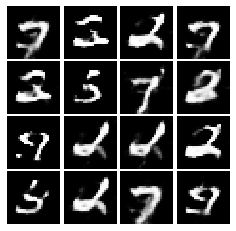

Epoch: 3, Iter: 1460, D: 0.4198, G:2.128


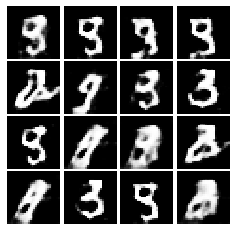

Epoch: 3, Iter: 1480, D: 0.2834, G:3.505


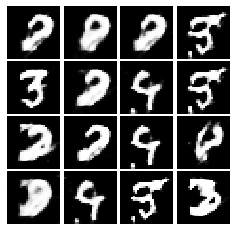

Epoch: 3, Iter: 1500, D: 0.6957, G:2.597


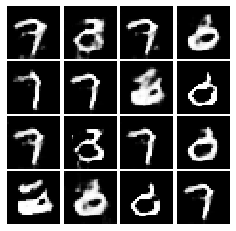

Epoch: 3, Iter: 1520, D: 0.3522, G:3.209


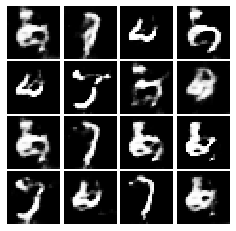

Epoch: 3, Iter: 1540, D: 0.2814, G:3.9


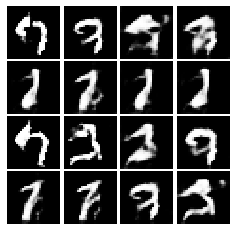

Epoch: 3, Iter: 1560, D: 0.7074, G:4.785


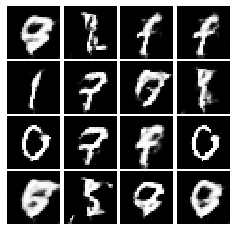

Epoch: 3, Iter: 1580, D: 0.8547, G:2.454


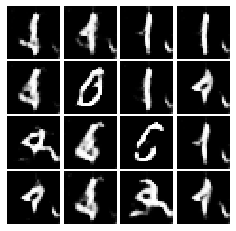

Epoch: 3, Iter: 1600, D: 0.296, G:3.29


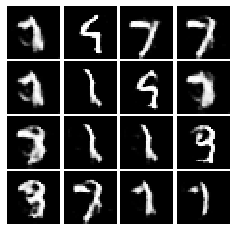

Epoch: 3, Iter: 1620, D: 0.5577, G:4.406


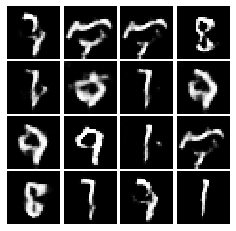

Epoch: 3, Iter: 1640, D: 0.4515, G:3.277


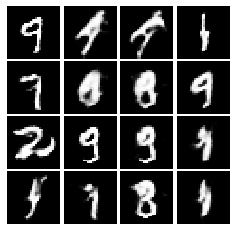

Epoch: 3, Iter: 1660, D: 0.3481, G:2.434


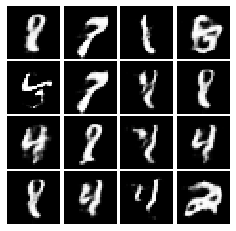

Epoch: 3, Iter: 1680, D: 0.3571, G:2.897


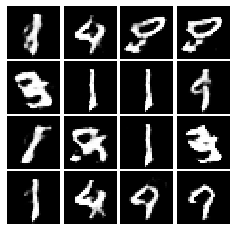

Epoch: 3, Iter: 1700, D: 0.4311, G:2.944


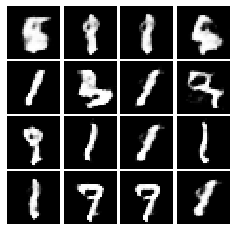

Epoch: 3, Iter: 1720, D: 0.5575, G:2.43


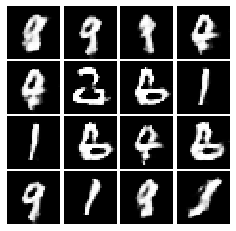

Epoch: 3, Iter: 1740, D: 0.6604, G:2.66


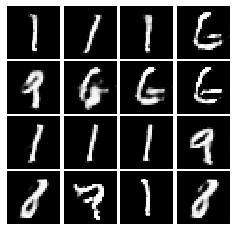

Epoch: 3, Iter: 1760, D: 0.5312, G:2.761


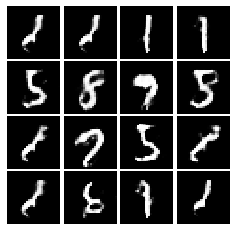

Epoch: 3, Iter: 1780, D: 0.5003, G:2.093


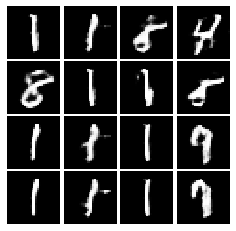

Epoch: 3, Iter: 1800, D: 0.7232, G:1.889


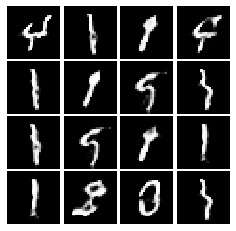

Epoch: 3, Iter: 1820, D: 0.8269, G:1.603


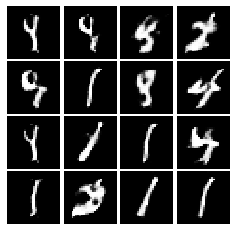

Epoch: 3, Iter: 1840, D: 0.5905, G:2.692


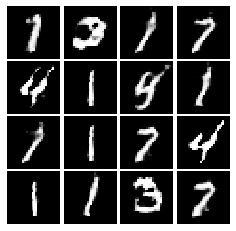

Epoch: 3, Iter: 1860, D: 0.4424, G:2.417


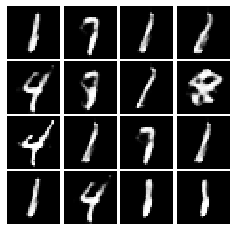

Epoch: 4, Iter: 1880, D: 0.4158, G:2.75


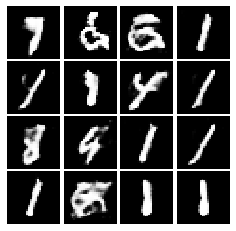

Epoch: 4, Iter: 1900, D: 0.45, G:2.437


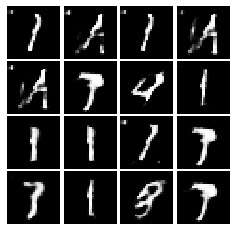

Epoch: 4, Iter: 1920, D: 0.5723, G:1.738


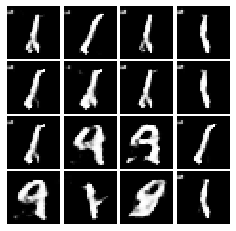

Epoch: 4, Iter: 1940, D: 0.2775, G:2.738


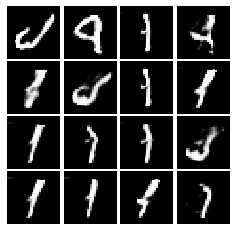

Epoch: 4, Iter: 1960, D: 0.5845, G:2.367


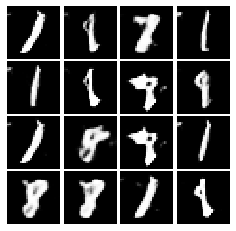

Epoch: 4, Iter: 1980, D: 0.5044, G:2.44


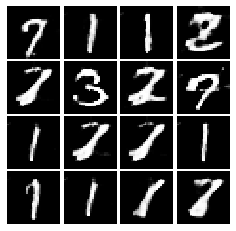

Epoch: 4, Iter: 2000, D: 0.6443, G:1.893


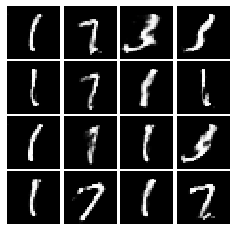

Epoch: 4, Iter: 2020, D: 0.5102, G:2.469


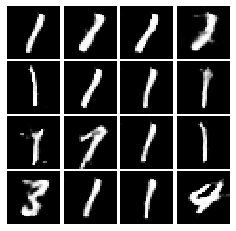

Epoch: 4, Iter: 2040, D: 0.5068, G:2.55


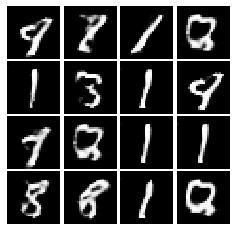

Epoch: 4, Iter: 2060, D: 0.3731, G:3.468


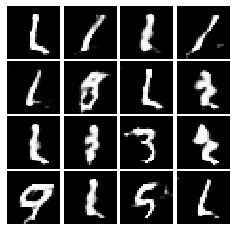

Epoch: 4, Iter: 2080, D: 0.5983, G:1.994


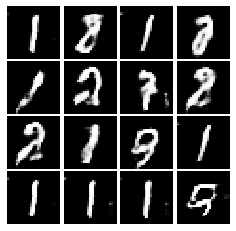

Epoch: 4, Iter: 2100, D: 0.4662, G:1.608


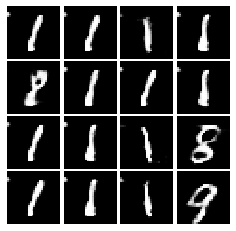

Epoch: 4, Iter: 2120, D: 0.5764, G:2.175


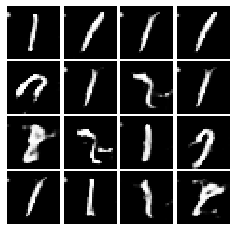

Epoch: 4, Iter: 2140, D: 0.5672, G:2.424


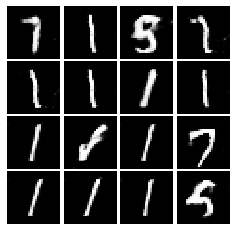

Epoch: 4, Iter: 2160, D: 0.6933, G:2.909


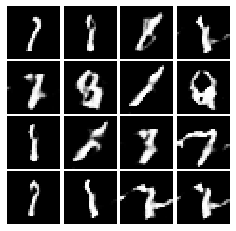

Epoch: 4, Iter: 2180, D: 0.6839, G:2.71


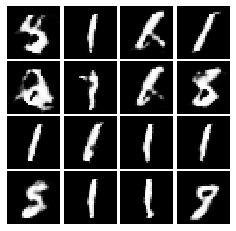

Epoch: 4, Iter: 2200, D: 0.4883, G:2.166


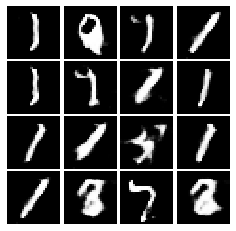

Epoch: 4, Iter: 2220, D: 0.545, G:1.888


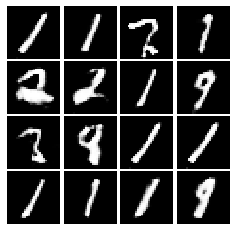

Epoch: 4, Iter: 2240, D: 0.4201, G:2.309


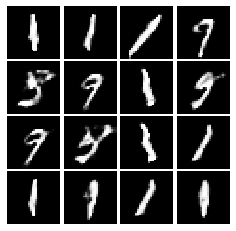

Epoch: 4, Iter: 2260, D: 0.5367, G:2.756


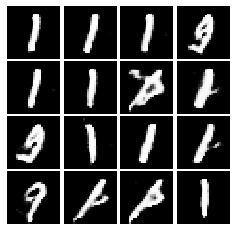

Epoch: 4, Iter: 2280, D: 0.4677, G:2.53


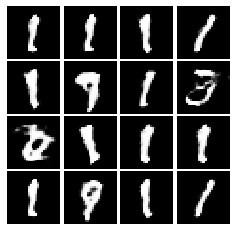

Epoch: 4, Iter: 2300, D: 0.4477, G:2.208


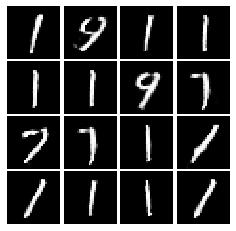

Epoch: 4, Iter: 2320, D: 0.4774, G:2.366


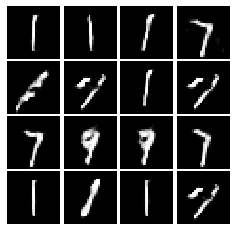

Epoch: 4, Iter: 2340, D: 0.4741, G:2.473


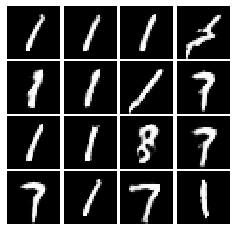

Final images


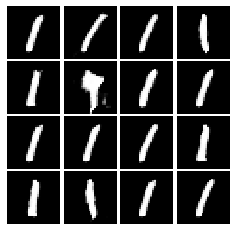

In [123]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2   |   1   |  -1   |    0  |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |  -1   |   -2  |  -1   |    -1 |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
